<font size=6>Automatic tagging of questions  
Part 2 : Unsupervised approach - Topic modeling - Additions</font>

This notebook adds new unsupervised approaches to the original part 2.  
It aims at using lemmatization and keeping only the nouns for the topic modeling.

---

**Checking environment**

In [ ]:
import sys
IN_COLAB = "google.colab" in sys.modules
# PATH_DRIVE : to change according to your Google Drive folders
PATH_DRIVE = "/content/drive/My Drive/MachineLearning/ML05"

In [ ]:
if IN_COLAB:
    print("Le notebook est exécuté sur Google Colab")
else:
    print("Le notebook est exécuté en local")

Le notebook est exécuté sur Google Colab


In [ ]:
if IN_COLAB:
    from google.colab import drive, files
    drive.mount("/content/drive")

Mounted at /content/drive


---

<font size=5>**Table of contents**</font>

[1. Notebook preparation](#1_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.1. Custom classes and methods](#1_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.2. Data loading](#1_2)  
  
[2. Topic modeling with Latent Dirichlet Allocation (LDA)](#2_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.1. First optimisation of hyperparameters with hyperopt](#2_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.2. Optimal LDA model analysis based on TF-IDF](#2_2)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.3. BOW vectorizer option analysis](#2_3)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.4. Optimal LDA model analysis based on BOW](#2_4)  
  
[3. Topic modeling with Non-negative Matrix Factorization (NMF)](#3_0)  
  
[4. Final unsupervised model selected](#4_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.1. Unsupervised suggestion of tags](#4_0)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.2. Semi-supervised classification of tags](#4_2)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.3. Saving the model for production](#4_3)  

---
## <font color=blue>Notebook set-up</font>

**Libraries importation**

In [ ]:
if IN_COLAB:
    !pip install -U tmtoolkit

Requirement already up-to-date: tmtoolkit in /usr/local/lib/python3.6/dist-packages (0.10.0)


In [ ]:
if IN_COLAB:
    !pip install scikit-multilearn

     |████████████████████████████████| 92kB 4.4MB/s 


In [ ]:
if IN_COLAB:
    !pip install pyldavis

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import nltk
import csv
import tensorflow_hub as hub
import joblib
if IN_COLAB:
  nltk.download('stopwords')
  nltk.download('wordnet')
  nltk.download('punkt')
  nltk.download('averaged_perceptron_tagger')
  import os

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [ ]:
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import NMF, LatentDirichletAllocation
from sklearn.manifold import TSNE
from skmultilearn.model_selection import iterative_train_test_split
from tmtoolkit.topicmod.evaluate import metric_coherence_gensim
from wordcloud import WordCloud
from hyperopt import hp, STATUS_OK, tpe, fmin, Trials, space_eval
from timeit import default_timer as timer
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.tag import pos_tag

In [ ]:
if IN_COLAB:
    sys.path.append(PATH_DRIVE)
    os.chdir(PATH_DRIVE)
    import sf_graphiques as sfg
else:
    import modules_perso.sf_graphiques as sfg

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


**Notebook set-up**

In [ ]:
def save_fig(fig_id, tight_layout=True, fig_extension="png", resolution=300):
    path = fig_id + "." + fig_extension
    if IN_COLAB:
        path = PATH_DRIVE + "/" + path
    #print("Saving figure", fig_id)
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, dpi=resolution)

---
<a id='1_0'></a>

## <font color=blue>1. Notebook preparation</font>

### 1.1. Custom classes and methods

I first define the stop words list and the regex I use for tokenization.

In [ ]:
full_stop_words = nltk.corpus.stopwords.words("english") + list(set(ENGLISH_STOP_WORDS) - set(nltk.corpus.stopwords.words("english")))
my_regex = r"(?!\d+)\w+[\w\+\#]*"

I define a class that will be used to lemmatize the tokenized words, and to keep only the nouns if needed.  
First, I will generate a tokenization on all train data, to get a rich enough vocabulary. This pre-tokenized list will be optionnally callable, to avoid to generate again and again the same lemmatization and tokenisation.

In [ ]:
# class to add lemmatization with WordNet to the sklearn vectorization
class LemmaTokenizer:

    def __init__(self, limit_to_nouns):
        self.limit_to_nouns = limit_to_nouns
        self.wnl = WordNetLemmatizer()
        self.tokenizer = RegexpTokenizer(r"(?!\d+)\w+[\w\+\#]*")

    def __call__(self, doc):
        interlist = [self.wnl.lemmatize(t) for t in self.tokenizer.tokenize(doc)]
        if self.limit_to_nouns:
            return [word for (word, tag) in pos_tag(interlist) if tag.startswith("NN")]
        return interlist

This class below is the main class used in this part. It includes the fitting of the text :
- the vocabulary is generated on all train data, to get a rich enough vocabulary ;
- factorization is calculated on a small subset of data, to speed up the research process ;
- the class provides functions to calculate the coherence score, to print the top_words for each topics, to show the wordcloud of top-words for a specific topic.

In [ ]:
class TextFactorization(BaseEstimator):

    # vectorizer_type must be one of "BOW" or "TFIDF"
    def __init__(self, vectorizer_type, stop_words, min_df, max_df, ngram_range,
                 model, limit_to_nouns=False):
        self.vectorizer_type = vectorizer_type
        self.stop_words = stop_words
        self.min_df = min_df
        self.max_df = max_df
        self.ngram_range = ngram_range
        self.limit_to_nouns = limit_to_nouns
        self.model = model
        self.vectorizer = None
        self.doctexts = None
        self.matrix_docwords = None
        self.matrix_doctopics = None
        self.matrix_topicswords = None
        
    def fit(self, X_vect, X_fact, y=None):
        if self.vectorizer_type == "BOW":
            self.vectorizer = CountVectorizer(tokenizer=LemmaTokenizer(self.limit_to_nouns),
                                              stop_words=self.stop_words,
                                              min_df=self.min_df,
                                              max_df=self.max_df,
                                              ngram_range=self.ngram_range)
        else:
            self.vectorizer = TfidfVectorizer(tokenizer=LemmaTokenizer(self.limit_to_nouns),
                                              stop_words=self.stop_words,
                                              min_df=self.min_df,
                                              max_df=self.max_df,
                                              ngram_range=self.ngram_range)
        self.vectorizer.fit(X_vect)
        self.matrix_docwords = self.vectorizer.transform(X_fact)
        tokenizer = self.vectorizer.build_analyzer()
        self.doctexts = [tokenizer(lin) for idx, lin in X_fact.items()]
        self.matrix_doctopics = self.model.fit_transform(self.matrix_docwords)
        self.matrix_topicswords = self.model.components_
        return self

    def transform(self, X=None):
        if X is None:
            return self.matrix_doctopics
        dtm = self.vectorizer.transform(X)
        return self.model.transform(dtm)

    def fit_transform(self, X_vect, X_fact, y=None):
        self.fit(X_vect, X_fact)
        return self.matrix_doctopics

    def coherence_score(self, measure="c_v", n_top_words=20, min_nb_words=None):
        if min_nb_words is None:
            min_nb_words = 3 * self.model.get_params()["n_components"]
        if len(self.vectorizer.get_feature_names()) < min_nb_words:
            return 0
        cs = metric_coherence_gensim(
            measure=measure,
            top_n=n_top_words,
            topic_word_distrib=self.matrix_topicswords,
            dtm=self.matrix_docwords,
            vocab=np.array(self.vectorizer.get_feature_names()),
            texts=self.doctexts,
            return_mean=True)
        return cs

    def print_topics(self, n_top_words=None):
        if n_top_words is None :
            n_top_words = min(20, len(self.vectorizer.get_feature_names()))
        vocab = self.vectorizer.get_feature_names()
        for topic_idx, topic in enumerate(self.model.components_):
            print("\nTopic {}:".format(topic_idx))
            print(" ".join([vocab[i]
                            for i in topic.argsort()[:-n_top_words-1:-1]]))
    
    def show_wordcloud(self, idx_topic):
        freq = dict()
        for word, coef in zip(self.vectorizer.get_feature_names(), self.model.components_[idx_topic]):
            freq[word] = coef
        graph = sfg.MyGraph("Words of topic n°{}".format(idx_topic), y_title=0.90)
        fig, ax = graph.fig, graph.ax
        wc = WordCloud(relative_scaling=0.33,
                       background_color="whitesmoke",
                       contour_color="lightgrey")\
             .generate_from_frequencies(freq)
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.show()

In [ ]:
# same as LemmaTokenizer without the option to limit to nouns
class LightLemmaTokenizer:

    def __init__(self):
        self.wnl = WordNetLemmatizer()
        self.tokenizer = RegexpTokenizer(r"(?!\d+)\w+[\w\+\#]*")

    def __call__(self, doc):
        return [self.wnl.lemmatize(t) for t in self.tokenizer.tokenize(doc)]

In [ ]:
# same as TextFactorization but with only the main informations for production
class LightTextFactorization(BaseEstimator):

    # vectorizer_type must be one of "BOW" or "TFIDF"
    def __init__(self, stop_words, min_df, max_df, ngram_range,
                 model):
        self.stop_words = stop_words
        self.min_df = min_df
        self.max_df = max_df
        self.ngram_range = ngram_range
        self.model = model
        self.vectorizer = None
        self.matrix_topicstags = None

    def __vect_fit(self, X):
        self.vectorizer = CountVectorizer(tokenizer=LightLemmaTokenizer(),
                                          stop_words=self.stop_words,
                                          min_df=self.min_df,
                                          max_df=self.max_df,
                                          ngram_range=self.ngram_range)
        return self.vectorizer.fit_transform(X)

    def fit(self, X, y):
        matrix_docwords = self.__vect_fit(X)
        matrix_doctopics = self.model.fit_transform(matrix_docwords)
        self.matrix_topicstags = np.dot(np.transpose(matrix_doctopics), y)
        return self

    def transform(self, X):
        dtm = self.vectorizer.transform(X)
        return self.model.transform(dtm)

    def fit_transform(self, X, y):
        matrix_docwords = self.__vect_fit(X)
        matrix_doctopics = self.model.fit_transform(matrix_docwords)
        self.matrix_topicstags = np.dot(np.transpose(matrix_doctopics), y)
        return matrix_doctopics
    
    def get_top_topic_index(self, one_body):
        matrix_doctopics = self.transform(one_body)
        return np.argmax(matrix_doctopics)

    def get_top_topic_words(self, one_body, n_top_words=5):
        top_topic_index = self.get_top_topic_index(one_body)
        vocab = self.vectorizer.get_feature_names()
        allwords = self.model.components_[top_topic_index, :]
        return [vocab[i] for i in allwords.argsort()[:-n_top_words-1:-1]]

    def get_top_topic_tags(self, one_body, n_top_tags=3):
        top_topic_index = self.get_top_topic_index(one_body)
        alltags = self.matrix_topicstags[top_topic_index, :]
        return [i for i in alltags.argsort()[:-n_top_tags-1:-1]]

In [ ]:
def get_lda_results(filename):
    df = pd.read_csv(filename)
    df["vectorizer"] = [param[param.find("vectorizer_type")+19: -2]
                        for param in df.params]
    df["mindf"] = [np.around(np.float(param[param.find("min_df")+9:
                   param.find("model__doc_topic_prior")-3]), 3)
                   for param in df.params]
    df["maxdf"] = [np.around(np.float(param[param.find("max_df")+9:
                   param.find("min_df")-3]), 3)
                   for param in df.params]
    df["ngram_range"] = [param[param.find("ngram_range")+14:
                         param.find("vectorizer_type")-3]
                         for param in df.params]
    df["nouns_only"] = [param[param.find("limit_to_nouns")+17:
                        param.find("max_df")-3]
                        for param in df.params]
    df["lda_ntopics"] = [np.int(param[param.find("model__n_components")+22: 
                         param.find("model__topic_word_prior")-3])
                         for param in df.params]
    df["lda_alpha"] = [np.float(param[param.find("model__doc_topic_prior")+25:
                       param.find("model__n_components")-3])
                       for param in df.params]
    df["lda_beta"] = [np.float(param[param.find("model__topic_word_prior")+26:
                      param.find("ngram_range")-3])
                      for param in df.params]
    return df.drop(columns="params")

In [ ]:
def get_nmf_results(filename):
    df = pd.read_csv(filename)
    df["vectorizer"] = [param[param.find("vectorizer_type")+19: -2]
                        for param in df.params]
    df["mindf"] = [np.around(np.float(param[param.find("min_df")+9:
                   param.find("model__alpha")-3]), 3)
                   for param in df.params]
    df["maxdf"] = [np.around(np.float(param[param.find("max_df")+9:
                   param.find("min_df")-3]), 3)
                   for param in df.params]
    df["ngram_range"] = [param[param.find("ngram_range")+14:
                         param.find("vectorizer_type")-3]
                         for param in df.params]
    df["nouns_only"] = [param[param.find("limit_to_nouns")+17:
                        param.find("max_df")-3]
                        for param in df.params]
    df["nmf_ntopics"] = [np.int(param[param.find("model__n_components")+22: 
                         param.find("ngram_range")-3])
                         for param in df.params]
    df["nmf_alpha"] = [np.around(np.float(param[param.find("model__alpha")+15:
                       param.find("model__l1_ratio")-3]), 3)
                       for param in df.params]
    df["nmf_l1_ratio"] = [np.around(np.float(param[param.find("model__l1_ratio")+18:
                      param.find("model__n_components")-3]), 3)
                      for param in df.params]
    return df.drop(columns="params")

In [ ]:
def graph_analysis_coherence(df, column_analysis, column_name, algo_name,
                             isbar=False, tick_step=1, rotation=0,
                             ymin=None, ymax=None, show_time=False):
    values = []
    labels = []
    for cl in np.unique(df[column_analysis]):
        if show_time:
            values.append(df[df[column_analysis]==cl].factorization_time.max())
            subtitle = "Longest Processing Time"
        else:
            values.append(df[df[column_analysis]==cl].coherence_score.max())
            subtitle = "Best Coherence Score"
        labels.append(cl)
    graph = sfg.MyGraph("{} : {}".format(algo_name, column_name))
    if isbar:
        graph.add_barv(np.arange(len(labels)), values,
                       bar_width=0.75, subtitle=subtitle)
    else:
        graph.add_plot(np.arange(len(labels)), values,
                       with_grid="both", grid_style=":", subtitle=subtitle)
    graph.ax[0].set_xticks(np.arange(0, len(labels), tick_step))
    graph.set_axe_x(label=column_name, tick_labels=labels[::tick_step],
                    rotation=rotation, tick_dash=True)
    if show_time:
        graph.set_axe_y(label="Maximum time (seconds)",
                        tick_min=ymin, tick_max=ymax)
        idx_ref = np.argmin(values)
        x_ref = idx_ref
    else:
        graph.set_axe_y(label="Best coherence score",
                        tick_min=ymin, tick_max=ymax)
        idx_ref = np.argmax(values)
        x_ref = idx_ref
    ymin, ymax = graph.ax[0].get_ylim()
    graph.add_fleches(x_ref, ymax, 0, values[idx_ref]-ymax,
                      units='xy', color="dimgrey")
    return graph.fig, graph.ax

<a id="1_2"></a>

### 1.2. Data loading

In [ ]:
X_fulltrain = pd.read_csv("X_train.csv", index_col=0, lineterminator='\n')
y_fulltrain = pd.read_csv("y_train.csv", index_col=0)
X_train = pd.read_csv("X_subtrain.csv", index_col=0, lineterminator='\n')
y_train = pd.read_csv("y_subtrain.csv", index_col=0)
X_valid = pd.read_csv("X_subvalid.csv", index_col=0, lineterminator='\n')
y_valid = pd.read_csv("y_subvalid.csv", index_col=0)
X_mini = pd.read_csv("X_mini.csv", index_col=0, lineterminator='\n')
y_mini = pd.read_csv("y_mini.csv", index_col=0)

I add a column named "both" to the dataframes X_mini and X_train to aggregate the body and the title.

In [ ]:
X_mini["both"] = X_mini["title"].fillna(" ") + " " + X_mini["body"].fillna(" ")
X_train["both"] = X_train["title"].fillna(" ") + " " + X_train["body"].fillna(" ")

---
<a id='2_0'></a>

## <font color=blue>2. Topic modeling with Latent Dirichlet Allocation (LDA)</font>

### 2.1. First optimisation of hyperparameters with hyperopt

I want to study :
- the interest to use TF-IDF instead of Bag of words ;
- the addition of bigrams and trigrams to monograms ;
- the interest to base the analysis on the body, on the title or on the aggregation of both ;
- the optimal parameters for the vectorizer and the factorizer.  
    
Remark : I set the coherence score to zero if the vectorizer results in a small size of vocabulary. To be more specific, I want to get a number of different words in my vocabulary that exceeds 5 times the number of topics. I include this rule to be sure to have enough diversity in my set of words, and so to have a significant coherence score.

In [ ]:
ITERATION = 0
OUT_FILE = ""

In [ ]:
lda = LatentDirichletAllocation(n_jobs=-1, random_state=42)
fact = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.05, max_df=0.95, ngram_range=(1, 1), model=lda,
                         limit_to_nouns=True)
fact.get_params().keys()

dict_keys(['limit_to_nouns', 'max_df', 'min_df', 'model__batch_size', 'model__doc_topic_prior', 'model__evaluate_every', 'model__learning_decay', 'model__learning_method', 'model__learning_offset', 'model__max_doc_update_iter', 'model__max_iter', 'model__mean_change_tol', 'model__n_components', 'model__n_jobs', 'model__perp_tol', 'model__random_state', 'model__topic_word_prior', 'model__total_samples', 'model__verbose', 'model', 'ngram_range', 'stop_words', 'vectorizer_type'])

In [ ]:
space_fact = {
    "data": hp.choice("data", ["body", "title", "both"]),
    "vectorizer_type": hp.choice("vectorizer_type", ["BOW", "TFIDF"]),
    "min_df": hp.uniform("min_df", 0.01, 0.05),
    "max_df": hp.uniform("max_df", 0.95, 0.99),
    "ngram_range": hp.choice("ngram_range", [(1, 1), (1, 2), (1, 3)]),
    "limit_to_nouns": hp.choice("limit_to_nouns", [True, False]),
    "model__n_components" : hp.choice("n_components",
                                      np.arange(10, 100, 5, dtype=int)),
    "model__doc_topic_prior": hp.choice("alpha",
                                        [0.05, 0.1, 0.5, 1, 5, 10]),
    "model__topic_word_prior": hp.choice("beta",
                                         [0.05, 0.1, 0.5, 1, 5, 10])}

In [ ]:
def objective_fact(params):
    global ITERATION, OUT_FILE
    ITERATION += 1

    input_data = params["data"]
    params_fact = {k:v for (k,v) in params.items() if k.startswith("data")==False}
    fact.set_params(**params_fact)

    start_time = timer()
    fact.fit(X_train[input_data], X_mini[input_data])
    fact_time = timer() - start_time
    
    score = fact.coherence_score()
    loss = -score

    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([score, fact_time, input_data, params_fact, ITERATION])
    of_connection.close()
    
    return {"loss": loss, "fact_time": fact_time, "params": params,
            "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
def run_fact_optimization(fact_file, max_evals=200):
    global OUT_FILE
    OUT_FILE = fact_file
    of_connection = open(OUT_FILE, "w")  # Write the headers to the file
    writer = csv.writer(of_connection)
    writer.writerow(["coherence_score", "factorization_time", "data", "params", "iteration"])
    of_connection.close()
    
    global ITERATION
    ITERATION = 0

    trials = Trials()
    
    best_param = fmin(objective_fact, space_fact,
                      algo=tpe.suggest, trials=trials,
                      max_evals=max_evals, rstate=np.random.RandomState(42))
    
    list_losses = [t["result"]["loss"] for t in trials.trials]
    idx_min = np.argmin(list_losses)

    print("Hyperparameters optimization done")
    print("Best coherence score = {}"\
          .format(-trials.trials[idx_min]["result"]["loss"]))
    print("Calculation time = {}"\
          .format(trials.trials[idx_min]["result"]["fact_time"]))
    print("Best coherence score obtained after {} iterations"\
          .format(trials.trials[idx_min]["result"]["iteration"]))
    print("")

In [ ]:
fact_file = "hyperopt_nouns_lda_first.csv"
run_fact_optimization(fact_file, max_evals=100)

  0%|          | 0/100 [00:00<?, ?it/s, best loss: ?]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))

/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()



 73%|███████▎  | 73/100 [9:20:06<2:14:34, 299.04s/it, best loss: -0.7890885812164767]

/usr/local/lib/python3.6/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning



 94%|█████████▍| 94/100 [11:54:43<39:40, 396.72s/it, best loss: -0.7899387466549097]

In [ ]:
lda_results = get_lda_results("hyperopt_nouns_lda_first.csv")
lda_results.sort_values(by="coherence_score", ascending=False).head(10)

,coherence_score,factorization_time,data,iteration,vectorizer,mindf,maxdf,ngram_range,nouns_only,lda_ntopics,lda_alpha,lda_beta
76,0.789939,318.548728,body,77,TFIDF,0.012,0.982,"(1, 3)",False,75,0.5,5.0
78,0.789939,325.659521,body,79,TFIDF,0.010,0.982,"(1, 3)",False,75,0.5,5.0
84,0.789939,316.895473,body,85,TFIDF,0.018,0.981,"(1, 3)",False,85,0.5,5.0
82,0.789939,314.024907,body,83,TFIDF,0.011,0.979,"(1, 3)",False,85,0.5,5.0
72,0.789089,316.164046,body,73,TFIDF,0.010,0.964,"(1, 3)",False,75,0.5,1.0
73,0.788972,310.257768,body,74,TFIDF,0.012,0.966,"(1, 3)",False,75,0.5,1.0
75,0.788494,317.274687,body,76,TFIDF,0.012,0.973,"(1, 3)",False,75,0.5,1.0
69,0.788450,278.801253,body,70,TFIDF,0.024,0.961,"(1, 3)",False,75,0.5,1.0
71,0.788436,283.693990,body,72,TFIDF,0.014,0.961,"(1, 3)",False,75,0.5,1.0
70,0.788256,281.156859,body,71,TFIDF,0.017,0.961,"(1, 3)",False,75,0.5,1.0


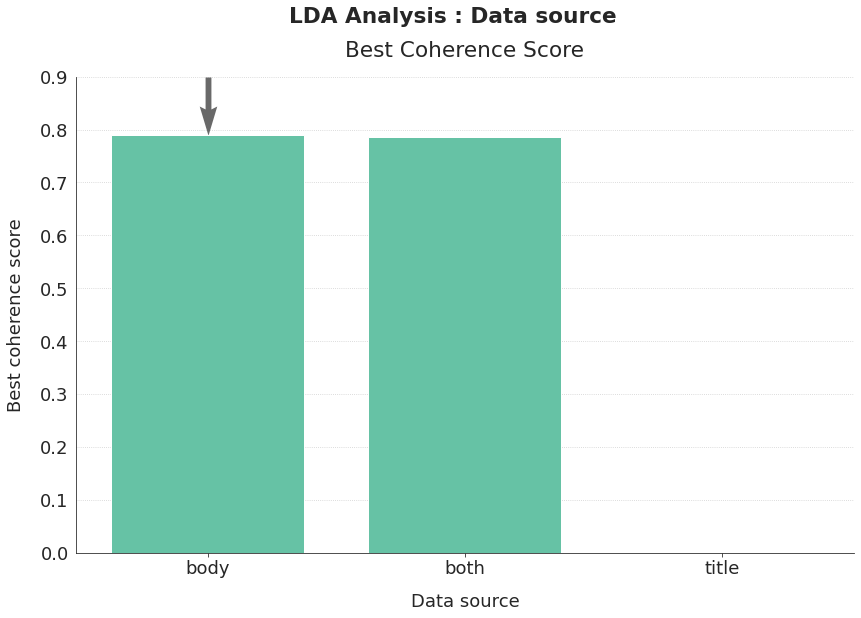

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="data", column_name="Data source",
                                   algo_name="LDA Analysis", ymax=0.90, isbar=True, show_time=False)
plt.show()

The zero coherence score for title as a data source comes from the fact that I force a vocabulary larger than 3 times the number of topics to get a valid coherence score. The model doesn't result in a large enough vocabulary set to get a valid score when I use only the titles as input.

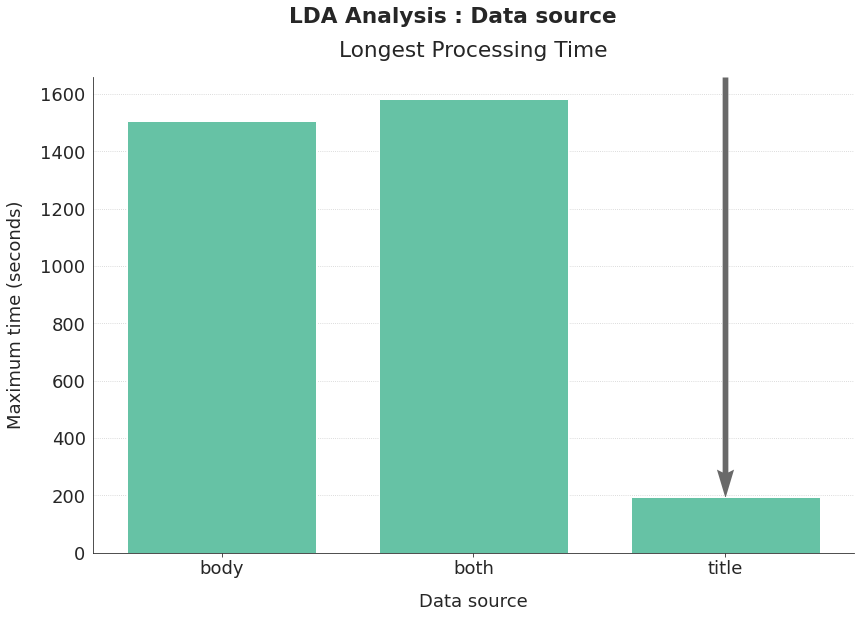

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="data", column_name="Data source",
                         algo_name="LDA Analysis", isbar=True, show_time=True)
plt.show()

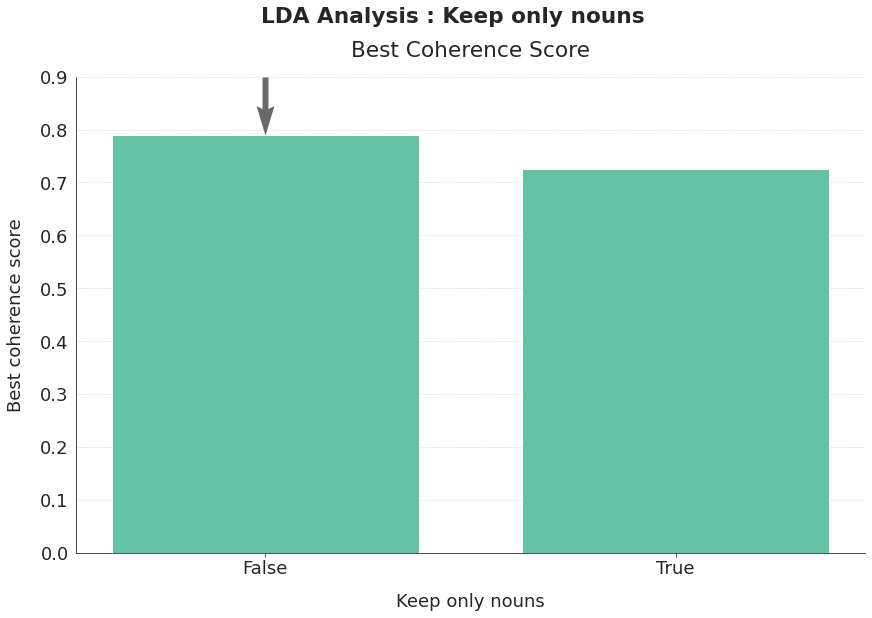

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="nouns_only", column_name="Keep only nouns",
                                   algo_name="LDA Analysis", ymax=0.90, isbar=True, show_time=False)
plt.show()

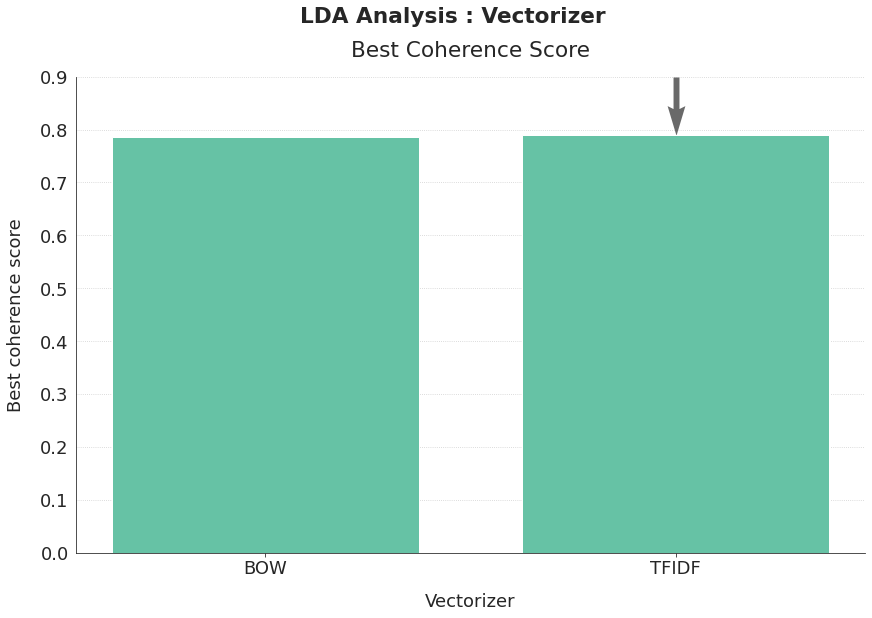

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="vectorizer", column_name="Vectorizer",
                         algo_name="LDA Analysis", ymax=0.90, isbar=True, show_time=False)
plt.show()

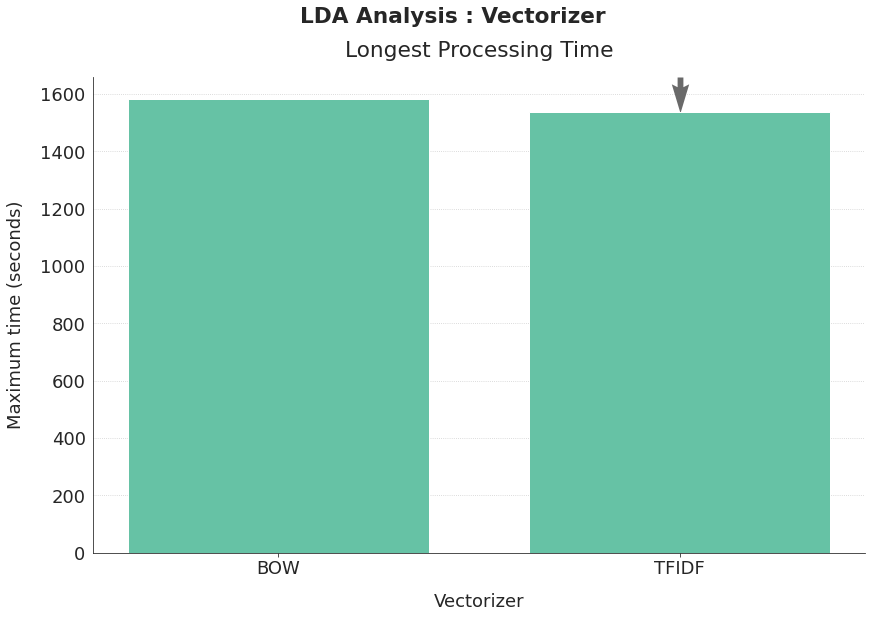

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="vectorizer", column_name="Vectorizer",
                         algo_name="LDA Analysis", isbar=True, show_time=True)
plt.show()

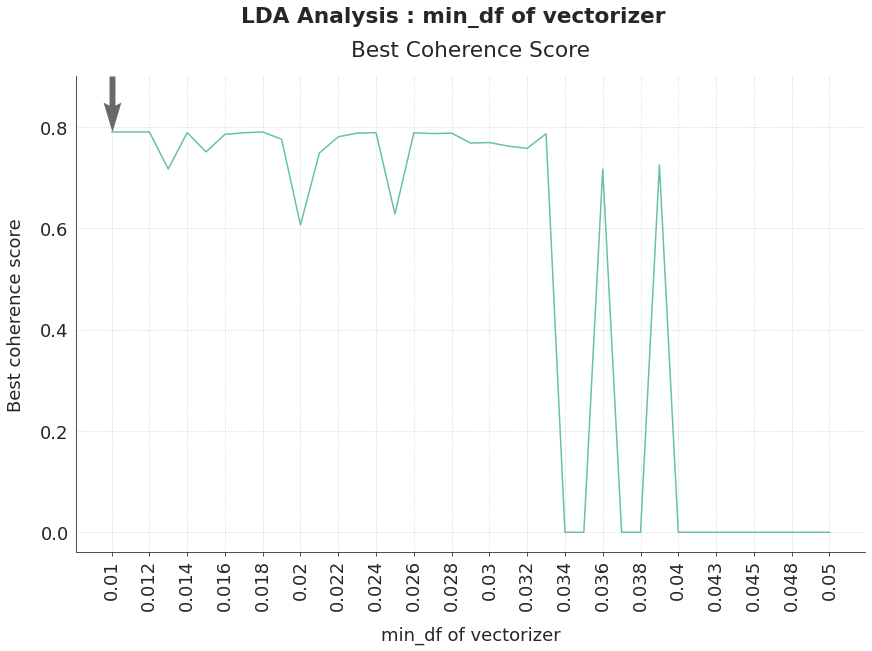

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="mindf", column_name="min_df of vectorizer",
                         algo_name="LDA Analysis", ymax=0.90, tick_step=2, rotation=90, show_time=False)
plt.show()

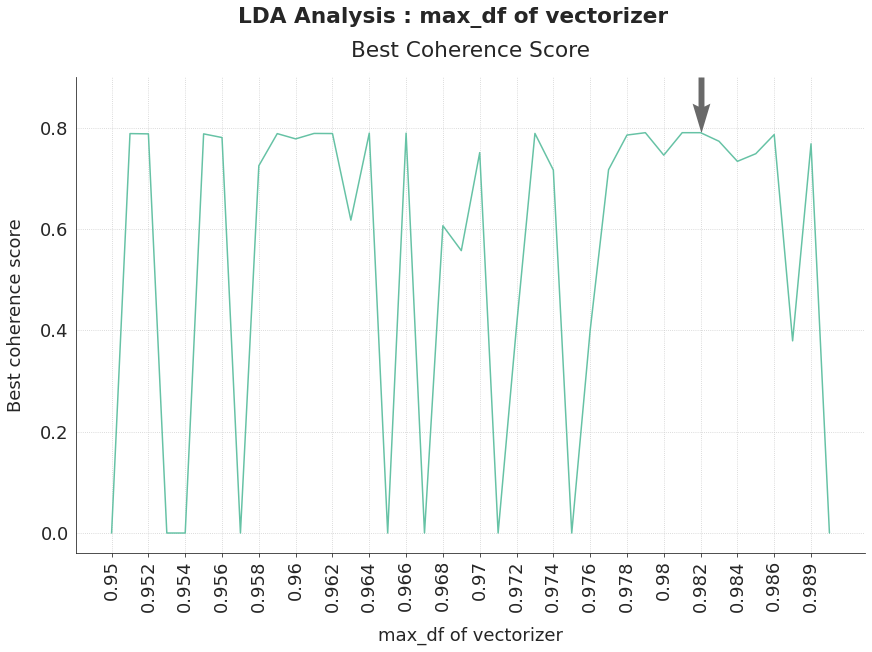

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="maxdf", column_name="max_df of vectorizer",
                         algo_name="LDA Analysis", ymax=0.90, tick_step=2, rotation=90, show_time=False)
plt.show()

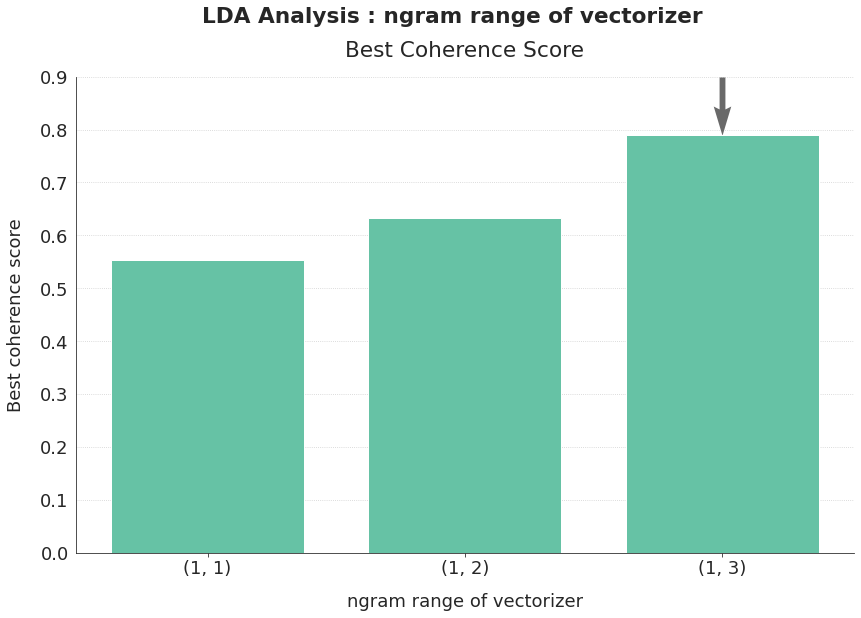

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="ngram_range", column_name="ngram range of vectorizer",
                         algo_name="LDA Analysis", ymax=0.90, isbar=True, show_time=False)
plt.show()

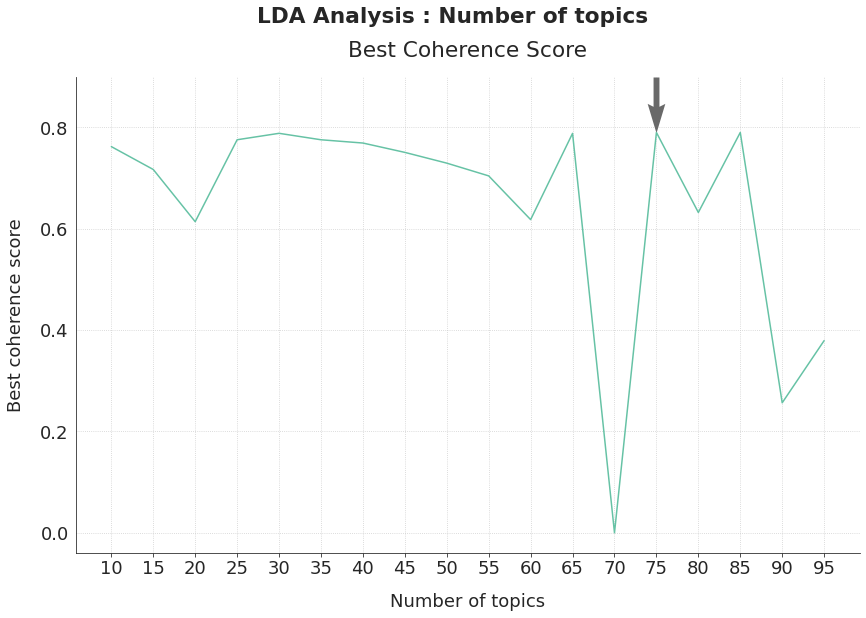

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="lda_ntopics", column_name="Number of topics",
                         algo_name="LDA Analysis", ymax=0.90, show_time=False)
plt.show()

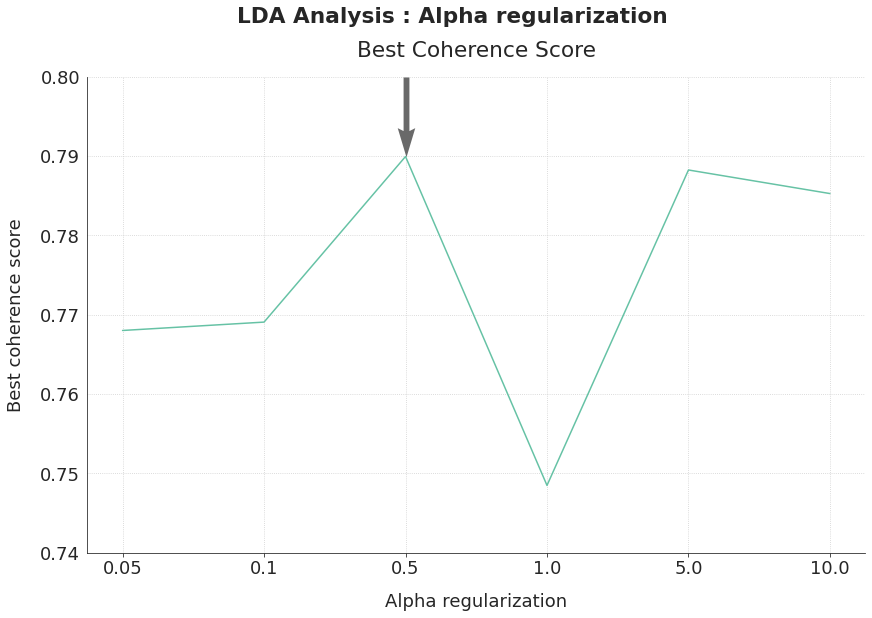

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="lda_alpha", column_name="Alpha regularization",
                         algo_name="LDA Analysis", ymax=0.80, ymin=0.74, show_time=False)
plt.show()

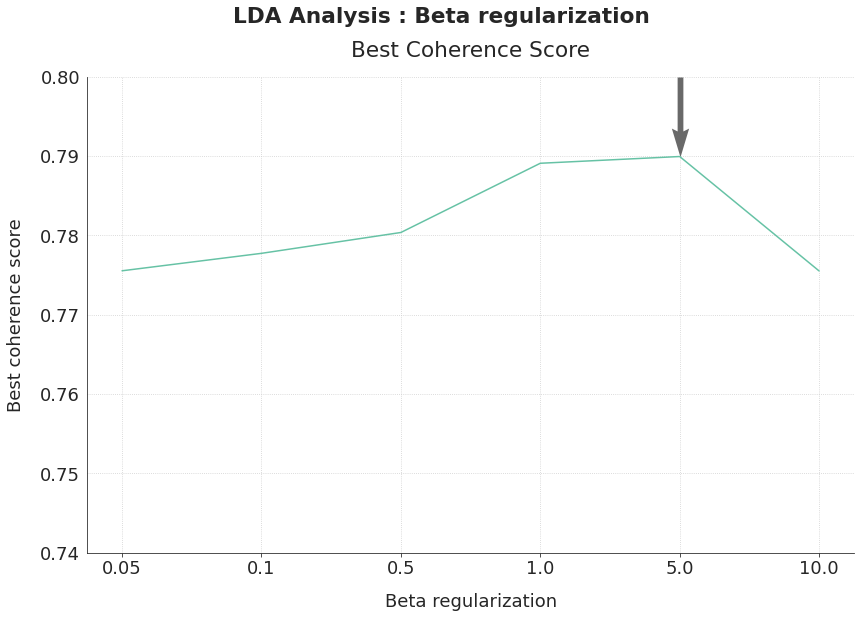

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="lda_beta", column_name="Beta regularization",
                         algo_name="LDA Analysis", ymax=0.80, ymin=0.74, show_time=False)
plt.show()

The best option is to use a TF-IDF on the body of the questions, keeping all types of words, adding bigrams and trigrams to the monograms.  
Optimal results come from a min_df around 1.1% and a max_df around 98% for the vectorizer, and a number of 75 topics, an alpha of 0.5 and a beta of 5.0 for the LDA model.

<a id="2_2"></a>

### 2.2. Optimal LDA model analysis based on TF-IDF

My analysis leads me to choose the following settings:
- vectorizer = TF-IDF
- limit to nouns = False
- min_df = 0.011
- max_df = 0.98
- ngram range = (1, 3)
- n_components = 75
- doc_topic_prior = 0.5
- topic_word_prior = 5.0

I check that I get similar coherence scores on the sub-part of train data (X_mini) and all train data (X_train).

In [ ]:
nb_topics = 75
lda = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=0.5, topic_word_prior=5.0,
                                n_jobs=-1, random_state=42)
fact = TextFactorization(vectorizer_type="TFIDF", stop_words=full_stop_words,
                         min_df=0.011, max_df=0.98, ngram_range=(1, 3), model=lda,
                         limit_to_nouns=False)
fact.fit(X_train.body, X_mini.body)
cv_score = fact.coherence_score()
print("Coherence score for {} topics based on partial training data = {:.2%}".format(nb_topics, cv_score))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


Coherence score for 75 topics based on partial training data = 78.99%


In [ ]:
nb_topics = 75
lda = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=0.5, topic_word_prior=5.0,
                                n_jobs=-1, random_state=42)
fact = TextFactorization(vectorizer_type="TFIDF", stop_words=full_stop_words,
                         min_df=0.011, max_df=0.98, ngram_range=(1, 3), model=lda,
                         limit_to_nouns=False)
fact.fit(X_train.body, X_train.body)
cv_score = fact.coherence_score()
print("Coherence score for {} topics based on all training data = {:.2%}".format(nb_topics, cv_score))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Coherence score for 75 topics based on all training data = 80.04%


We obtain a similar coherence score (even slightly higher) on all training data.

I check the results and the 10 top words for each topic.  
I also look at the pyLDAvis visualization.

In [ ]:
nb_words = 10
print("{} topics found via LDA - Coherence score = {}".format(nb_topics, cv_score))
fact.print_topics(n_top_words=nb_words)

75 topics found via LDA - Coherence score = 0.8004158812711966

Topic 0:
code using way like file use want error work data

Topic 1:
like file code way using use error work want class

Topic 2:
file like using use work class want code way method

Topic 3:
file code like want using way use function error work

Topic 4:
using like code want file error work way use need

Topic 5:
like want using code file class way error use following

Topic 6:
code using like error way use file want method class

Topic 7:
code file error use using like want way work class

Topic 8:
like using code way want use function error file class

Topic 9:
want like code using file error work way use example

Topic 10:
using code error like use file way work want method

Topic 11:
like using code file use want error way example work

Topic 12:
like using code file use way want work example error

Topic 13:
like file code using use error way following class know

Topic 14:
like use error file using way need followin

In [ ]:
pyLDAvis.sklearn.prepare(fact.model, fact.matrix_docwords, fact.vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
63    -0.000690 -0.000082       1        1  1.333442
20     0.000247 -0.000039       2        1  1.333440
32    -0.000149 -0.000214       3        1  1.333424
3     -0.000155  0.000175       4        1  1.333423
39     0.000255 -0.000034       5        1  1.333398
...         ...       ...     ...      ...       ...
17     0.000209  0.000052      71        1  1.333260
70     0.000058 -0.000112      72        1  1.333259
46    -0.000112  0.000002      73        1  1.333248
74     0.000127 -0.000010      74        1  1.333244
27    -0.000423  0.000093      75        1  1.333234

[75 rows x 5 columns], topic_info=        Term         Freq        Total Category  logprob  loglift
287     like  8560.000000  8560.000000  Default  30.0000  30.0000
202     file  7503.000000  7503.000000  Default  29.0000  29.0000
90      code  8207.000000  8207.000000  Default  28.0000  28.0000
549     want  7069.000000  7069.000000  Default  27.0000  27.0000
537    using  7957.000000  7957.000000  Default  26.0000  26.0000
..       ...          ...          ...      ...      ...      ...
182  example    59.323811  4854.392280  Topic75  -5.3606  -0.0871
178    error    69.795049  6289.202143  Topic75  -5.1981  -0.1835
547       wa    51.598043  4070.678151  Topic75  -5.5001  -0.0505
85     class    56.651148  5126.442444  Topic75  -5.4067  -0.1877
134     data    50.378917  4203.303212  Topic75  -5.5240  -0.1065

[3977 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         1  0.013713  able
0         2  0.011696  able
0         3  0.012503  able
0         4  0.013310  able
0         5  0.013713  able
...     ...       ...   ...
571      71  0.013364   xml
571      72  0.014478   xml
571      73  0.013364   xml
571      74  0.012807   xml
571      75  0.013364   xml

[18450 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[64, 21, 33, 4, 40, 73, 48, 41, 14, 32, 38, 6, 72, 52, 57, 43, 15, 58, 54, 31, 2, 51, 34, 56, 27, 22, 68, 55, 67, 44, 1, 36, 12, 3, 63, 5, 9, 45, 30, 20, 16, 35, 49, 42, 23, 26, 70, 39, 50, 24, 19, 13, 60, 59, 8, 7, 10, 25, 29, 65, 61, 62, 66, 53, 46, 11, 37, 69, 74, 17, 18, 71, 47, 75, 28])

The 3 or 5 top words for each topic are not useful as a tag or to predict a tag.  
However, the pyLDAvis visualization shows that a lot of topics are well differentiated from each others. It may be interesting to try to get tags from here.

I had almost the same top coherence score with the BOW vectorizer. As the LDA should theorically be based on a BOW distribution, I check the coherence score for the BOW vectorizer with the same parameters, and I look at the top words and the pyLDAvis visualization.

In [ ]:
nb_topics = 75
lda2 = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=0.5, topic_word_prior=5.0,
                                n_jobs=-1, random_state=42)
fact2 = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.011, max_df=0.98, ngram_range=(1, 3), model=lda2,
                         limit_to_nouns=False)
fact2.fit(X_train.body, X_train.body)
cv_score2 = fact2.coherence_score()
print("Coherence score for {} topics and a BOW vectorization based on all training data = {:.2%}"\
      .format(nb_topics, cv_score2))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


Coherence score for 75 topics and a BOW vectorization based on all training data = 75.16%


In [ ]:
nb_words = 10
print("{} topics found via LDA - Coherence score = {}".format(nb_topics, cv_score2))
fact2.print_topics(n_top_words=nb_words)

75 topics found via LDA - Coherence score = 0.7515985892819802

Topic 0:
thread main task block operation multiple single running read question

Topic 1:
library support developer use using like link ha built documentation

Topic 2:
list json like using object want way trying convert example

Topic 3:
file directory read write open save output using want source

Topic 4:
net framework c# web asp asp net mvc using microsoft article

Topic 5:
class instance method static member base defined define called like

Topic 6:
table row delete column want ha duplicate order select need

Topic 7:
request api header send rest using need content work make

Topic 8:
query event loop second connection close using like need ha

Topic 9:
index bug work want using like tried fixed problem example

Topic 10:
custom wa wondering wa wondering using way trying use like work

Topic 11:
process update store pattern record insert design need entry ha

Topic 12:
model django create save like using way want need

In [ ]:
pyLDAvis.sklearn.prepare(fact2.model, fact2.matrix_docwords, fact2.vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
53     0.039247  0.016035       1        1  2.078527
41    -0.263728 -0.009841       2        1  1.874537
38    -0.217484 -0.092151       3        1  1.753089
17     0.140504  0.006085       4        1  1.731152
44    -0.002463  0.213693       5        1  1.685667
...         ...       ...     ...      ...       ...
9      0.051815 -0.057595      71        1  1.085445
66     0.065540 -0.038071      72        1  1.067774
49     0.031420 -0.048744      73        1  1.065920
34     0.088308 -0.023553      74        1  1.056858
24     0.060740 -0.081740      75        1  1.041270

[75 rows x 5 columns], topic_info=         Term          Freq         Total Category  logprob  loglift
202      file  74315.000000  74315.000000  Default  30.0000  30.0000
134      data  45493.000000  45493.000000  Default  29.0000  29.0000
178     error  50702.000000  50702.000000  Default  28.0000  28.0000
85      class  44857.000000  44857.000000  Default  27.0000  27.0000
540     value  42146.000000  42146.000000  Default  26.0000  26.0000
..        ...           ...           ...      ...      ...      ...
333      need    571.872527  60506.897101  Topic75  -4.8531  -0.0969
232        ha    499.605615  50452.079520  Topic75  -4.9882  -0.0502
547        wa    457.689924  47159.944303  Topic75  -5.0759  -0.0704
396  question    410.241703  42971.983128  Topic75  -5.1853  -0.0868
127    create    347.233394  28940.635247  Topic75  -5.3521   0.1417

[3553 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         1  0.016898  able
0         2  0.008805  able
0         3  0.003824  able
0         4  0.011918  able
0         5  0.002713  able
...     ...       ...   ...
572      71  0.013991   yes
572      72  0.008395   yes
572      73  0.019307   yes
572      74  0.018748   yes
572      75  0.010633   yes

[42975 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[54, 42, 39, 18, 45, 71, 4, 51, 64, 55, 30, 46, 57, 6, 47, 23, 22, 19, 59, 1, 12, 37, 17, 43, 16, 29, 69, 5, 62, 73, 53, 32, 27, 21, 28, 9, 56, 72, 48, 41, 8, 36, 34, 2, 60, 15, 11, 20, 63, 33, 7, 75, 13, 44, 49, 70, 14, 74, 66, 24, 58, 68, 65, 40, 52, 38, 61, 3, 26, 31, 10, 67, 50, 35, 25])

The BOW model gives much more interesting top words, despite a lower coherence score. In the case of BOW, top words can be used as tags.  
The visualization shows that the topics are not too much redundant.

I had almost the same results with 65 topics. I look at the results with the BOW with 65 topics to see if I can again decrease the number of redundance and increase the significativity of the 5 top words for each topic.

In [ ]:
nb_topics = 65
lda2 = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=0.5, topic_word_prior=5.0,
                                n_jobs=-1, random_state=42)
fact2 = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.011, max_df=0.98, ngram_range=(1, 3), model=lda2,
                         limit_to_nouns=False)
fact2.fit(X_train.body, X_train.body)
cv_score2 = fact2.coherence_score()
print("Coherence score for {} topics and a BOW vectorization based on all training data = {:.2%}"\
      .format(nb_topics, cv_score2))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


Coherence score for 65 topics and a BOW vectorization based on all training data = 74.78%


In [ ]:
nb_words = 10
print("{} topics found via LDA - Coherence score = {}".format(nb_topics, cv_score2))
fact2.print_topics(n_top_words=nb_words)

65 topics found via LDA - Coherence score = 0.747841709252355

Topic 0:
thread task main block operation performance multiple second single read

Topic 1:
library support developer native use using like documentation link doe

Topic 2:
list json like using want way example convert trying use

Topic 3:
file directory read output write save want using like create

Topic 4:
net web c# asp asp net mvc action using microsoft article

Topic 5:
class instance method static member base defined define like called

Topic 6:
table row id delete want record duplicate ha order column

Topic 7:
request api header content send using rest need use code

Topic 8:
query column event loop connection close second like using database

Topic 9:
index width want bug fixed set work tried right like

Topic 10:
wa custom wondering statement using wa wondering understand use trying way

Topic 11:
update process store database structure pattern insert design db good

Topic 12:
field model django create like using

In [ ]:
pyLDAvis.sklearn.prepare(fact2.model, fact2.matrix_docwords, fact2.vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
53    -0.038065 -0.004006       1        1  2.401587
41     0.258512  0.068006       2        1  2.050299
17    -0.138361 -0.011064       3        1  2.018484
38     0.250637 -0.026544       4        1  1.990235
21     0.029018 -0.067059       5        1  1.962349
...         ...       ...     ...      ...       ...
24    -0.021197 -0.116113      61        1  1.295749
23    -0.029844 -0.021452      62        1  1.283044
25    -0.096822  0.022873      63        1  1.279624
2     -0.061120 -0.050180      64        1  1.237174
49    -0.021543 -0.054703      65        1  1.212311

[65 rows x 5 columns], topic_info=        Term          Freq         Total Category  logprob  loglift
202     file  77834.000000  77834.000000  Default  30.0000  30.0000
178    error  52141.000000  52141.000000  Default  29.0000  29.0000
134     data  46284.000000  46284.000000  Default  28.0000  28.0000
85     class  46220.000000  46220.000000  Default  27.0000  27.0000
540    value  42886.000000  42886.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
426      run    556.890277  36888.544322  Topic65  -5.0318   0.2194
232       ha    615.270511  49888.270104  Topic65  -4.9321   0.0172
182  example    548.685532  50918.996853  Topic65  -5.0466  -0.1178
534     used    461.683485  27721.895071  Topic65  -5.2193   0.3175
239     help    456.801932  27822.337221  Topic65  -5.2299   0.3033

[3019 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         1  0.023679  able
0         2  0.010669  able
0         3  0.011704  able
0         4  0.004592  able
0         5  0.007293  able
...     ...       ...   ...
572      61  0.010933   yes
572      62  0.025319   yes
572      63  0.016112   yes
572      64  0.004891   yes
572      65  0.024168   yes

[37180 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[54, 42, 18, 39, 22, 45, 12, 51, 4, 1, 37, 64, 6, 57, 30, 19, 55, 43, 11, 59, 23, 15, 62, 35, 47, 53, 27, 21, 41, 32, 56, 48, 5, 8, 20, 28, 9, 46, 33, 7, 52, 60, 17, 58, 36, 2, 31, 63, 34, 61, 40, 13, 16, 44, 49, 29, 65, 10, 14, 38, 25, 24, 26, 3, 50])

With 65 topics, I get almost the same coherence score. The 5 top-words for each topic seem to be more pertinent from an informatic point of view with more specific and technic words and less generic words.  
The pyLDAvis visualization shows a global diversification of topics that is satisfying, even if some topics overlap on other topics.

<a id="2_3"></a>

### 2.3. BOW vectorizer option analysis

I run a new optimization to see what are the optimal parameters with a BOW vectorizer.

In [ ]:
lda_results[lda_results.vectorizer=="BOW"].sort_values(by="coherence_score", ascending=False).head(10)

,coherence_score,factorization_time,data,iteration,vectorizer,mindf,maxdf,ngram_range,nouns_only,lda_ntopics,lda_alpha,lda_beta
83,0.785271,353.039180,both,84,BOW,0.016,0.978,"(1, 3)",False,85,10.00,5.0
61,0.780366,311.363109,both,62,BOW,0.022,0.956,"(1, 3)",False,30,5.00,0.5
44,0.750613,321.004754,body,45,BOW,0.015,0.970,"(1, 3)",False,45,0.50,5.0
54,0.729405,367.204916,both,55,BOW,0.017,0.960,"(1, 3)",False,50,0.10,1.0
88,0.716858,335.423692,body,89,BOW,0.013,0.977,"(1, 3)",False,15,0.50,5.0
2,0.716230,1459.602900,body,3,BOW,0.036,0.974,"(1, 3)",True,10,0.05,10.0
13,0.628017,183.118365,body,14,BOW,0.025,0.982,"(1, 2)",False,45,10.00,10.0
3,0.617950,195.074230,both,4,BOW,0.011,0.955,"(1, 2)",False,60,10.00,0.5
57,0.617440,192.166891,both,58,BOW,0.031,0.963,"(1, 2)",False,30,5.00,1.0
48,0.613852,1563.565330,both,49,BOW,0.036,0.978,"(1, 2)",True,20,0.10,0.5


I run the optimization only on body and both data, with a ngram range of (1, 3). I don't limit the words to nouns.

In [ ]:
lda = LatentDirichletAllocation(n_jobs=-1, random_state=42)
fact = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.05, max_df=0.95, ngram_range=(1, 3), model=lda,
                         limit_to_nouns=False)
fact.get_params().keys()

dict_keys(['limit_to_nouns', 'max_df', 'min_df', 'model__batch_size', 'model__doc_topic_prior', 'model__evaluate_every', 'model__learning_decay', 'model__learning_method', 'model__learning_offset', 'model__max_doc_update_iter', 'model__max_iter', 'model__mean_change_tol', 'model__n_components', 'model__n_jobs', 'model__perp_tol', 'model__random_state', 'model__topic_word_prior', 'model__total_samples', 'model__verbose', 'model', 'ngram_range', 'stop_words', 'vectorizer_type'])

In [ ]:
space_fact = {
    "data": hp.choice("data", ["body", "both"]),
    "vectorizer_type": "BOW",
    "min_df": hp.uniform("min_df", 0.01, 0.05),
    "max_df": hp.uniform("max_df", 0.95, 0.99),
    "ngram_range": (1, 3),
    "limit_to_nouns": False,
    "model__n_components" : hp.choice("n_components",
                                      np.arange(10, 100, 5, dtype=int)),
    "model__doc_topic_prior": hp.choice("alpha",
                                        [0.05, 0.1, 0.5, 1, 5, 10]),
    "model__topic_word_prior": hp.choice("beta",
                                         [0.05, 0.1, 0.5, 1, 5, 10])}

In [ ]:
fact_file = "hyperopt_nouns_lda_second.csv"
run_fact_optimization(fact_file, max_evals=50)

  0%|          | 0/50 [00:00<?, ?it/s, best loss: ?]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



100%|██████████| 50/50 [3:36:26<00:00, 259.74s/it, best loss: -0.7923284614639008]
Hyperparameters optimization done
Best coherence score = 0.7923284614639008
Calculation time = 239.269588930998
Best coherence score obtained after 30 iterations



In [ ]:
lda_results = get_lda_results("hyperopt_nouns_lda_second.csv")
lda_results.sort_values(by="coherence_score", ascending=False).head(10)

,coherence_score,factorization_time,data,iteration,vectorizer,mindf,maxdf,ngram_range,nouns_only,lda_ntopics,lda_alpha,lda_beta
29,0.792328,239.269589,body,30,BOW,0.017,0.983,"(1, 3)",False,95,1.0,5.0
27,0.792107,240.597046,body,28,BOW,0.016,0.982,"(1, 3)",False,95,1.0,10.0
10,0.791964,242.636539,body,11,BOW,0.015,0.980,"(1, 3)",False,55,5.0,5.0
21,0.791432,234.463632,body,22,BOW,0.010,0.975,"(1, 3)",False,35,5.0,10.0
23,0.791415,232.903505,body,24,BOW,0.020,0.985,"(1, 3)",False,35,5.0,10.0
8,0.791294,237.826450,body,9,BOW,0.015,0.954,"(1, 3)",False,50,5.0,10.0
40,0.791233,249.525513,body,41,BOW,0.017,0.981,"(1, 3)",False,65,1.0,5.0
24,0.791093,235.680436,body,25,BOW,0.012,0.974,"(1, 3)",False,25,5.0,10.0
16,0.789851,235.472775,body,17,BOW,0.014,0.957,"(1, 3)",False,85,10.0,0.5
26,0.789484,236.535655,body,27,BOW,0.019,0.974,"(1, 3)",False,60,5.0,0.5


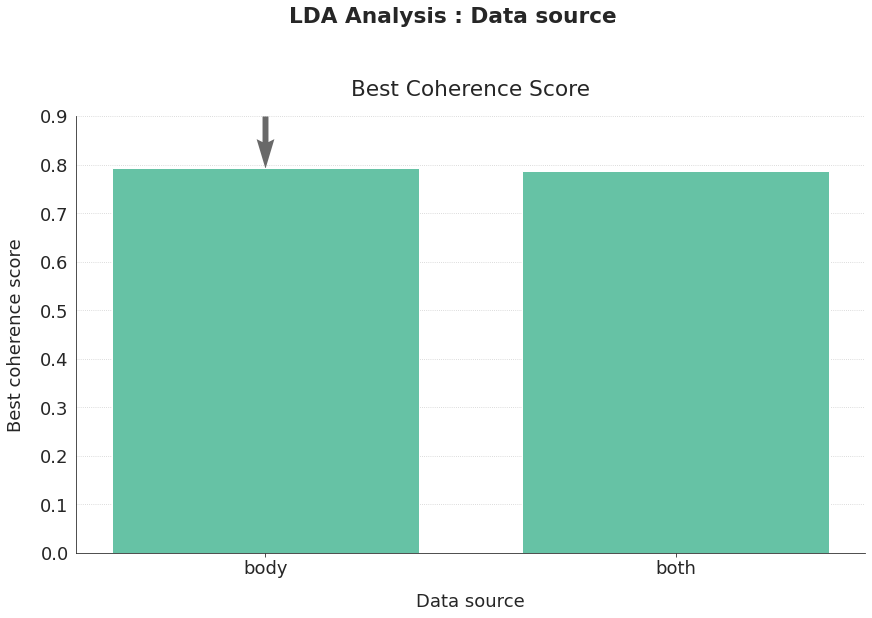

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="data", column_name="Data source",
                                   algo_name="LDA Analysis", ymax=0.90, isbar=True, show_time=False)
plt.show()

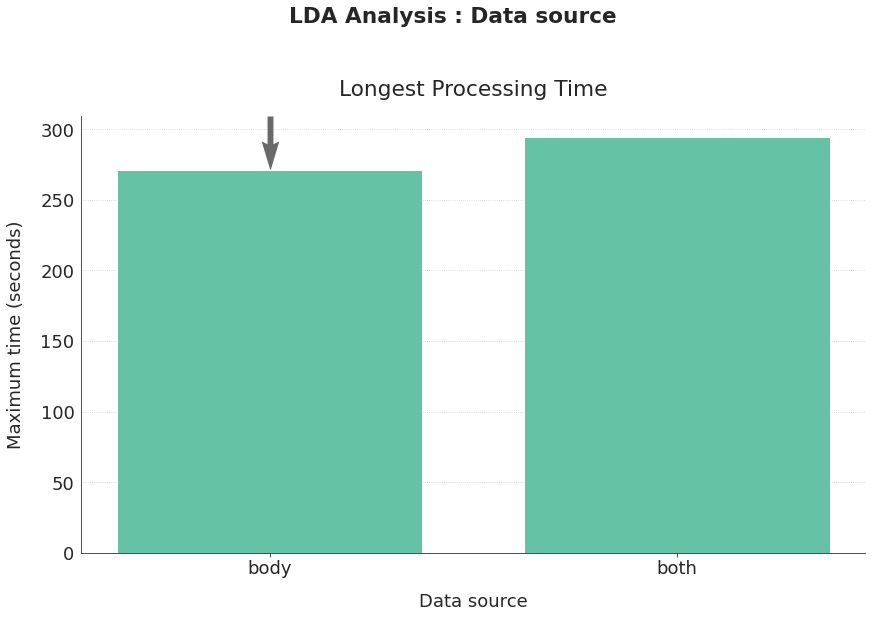

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="data", column_name="Data source",
                         algo_name="LDA Analysis", isbar=True, show_time=True)
plt.show()

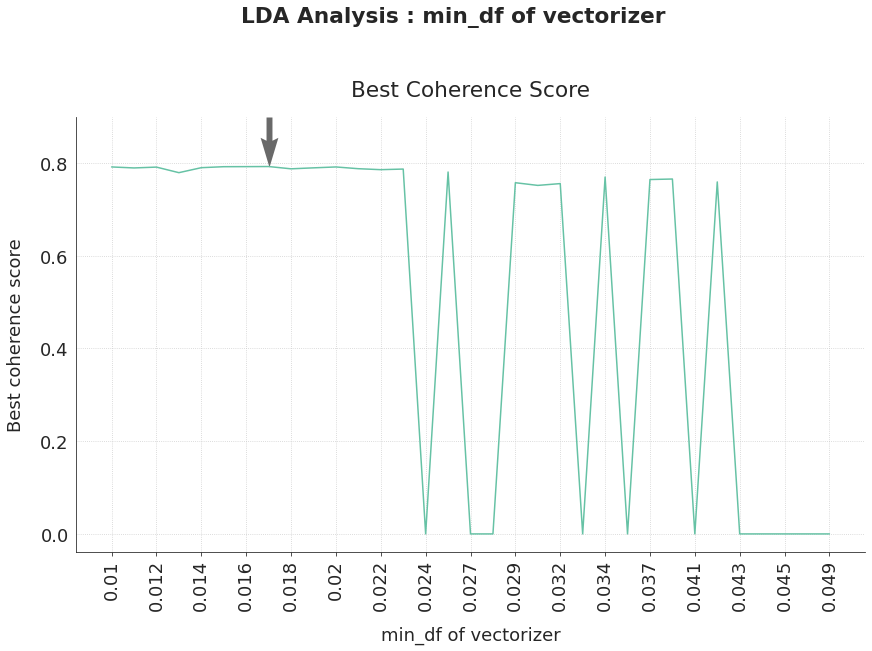

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="mindf", column_name="min_df of vectorizer",
                         algo_name="LDA Analysis", ymax=0.90, tick_step=2, rotation=90, show_time=False)
plt.show()

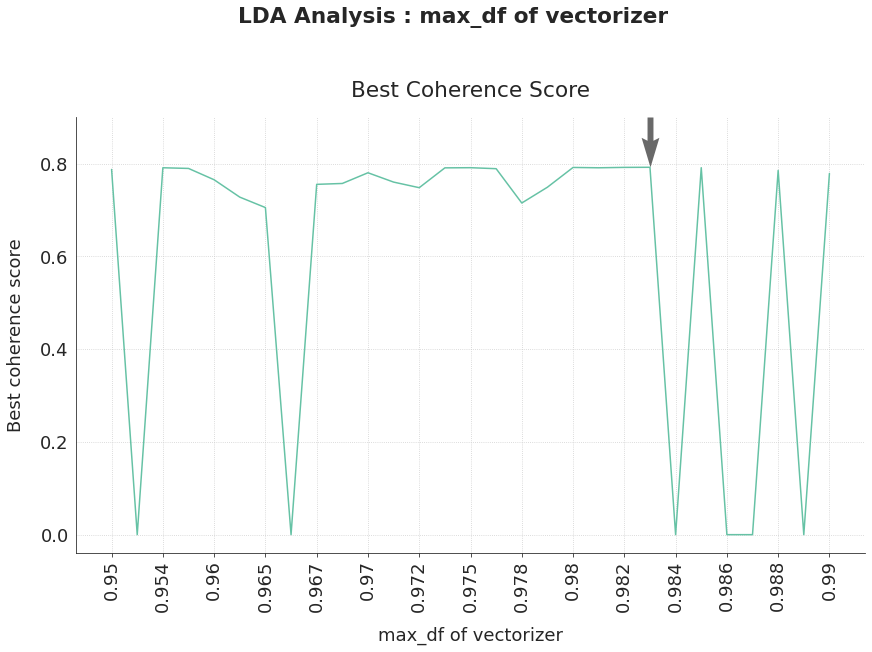

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="maxdf", column_name="max_df of vectorizer",
                         algo_name="LDA Analysis", ymax=0.90, tick_step=2, rotation=90, show_time=False)
plt.show()

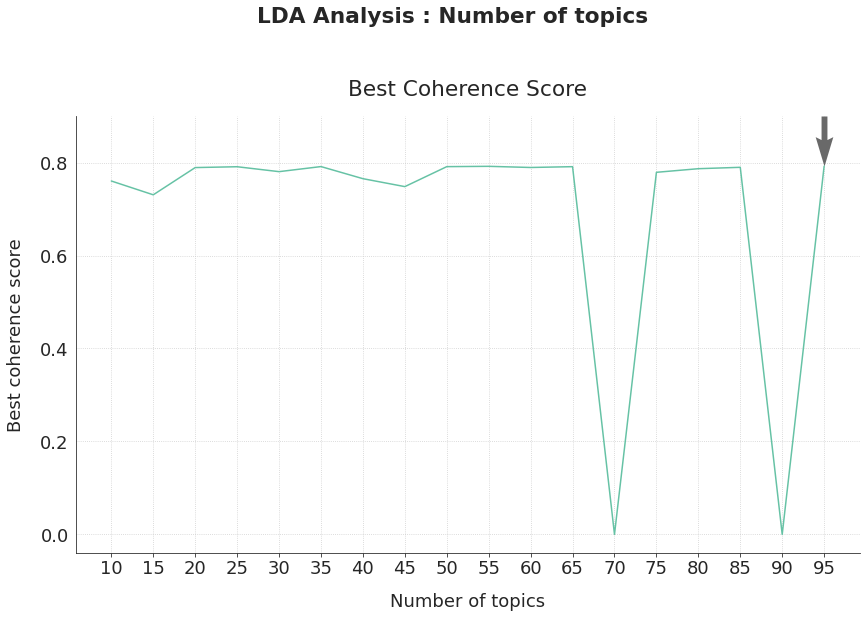

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="lda_ntopics", column_name="Number of topics",
                         algo_name="LDA Analysis", ymax=0.90, show_time=False)
plt.show()

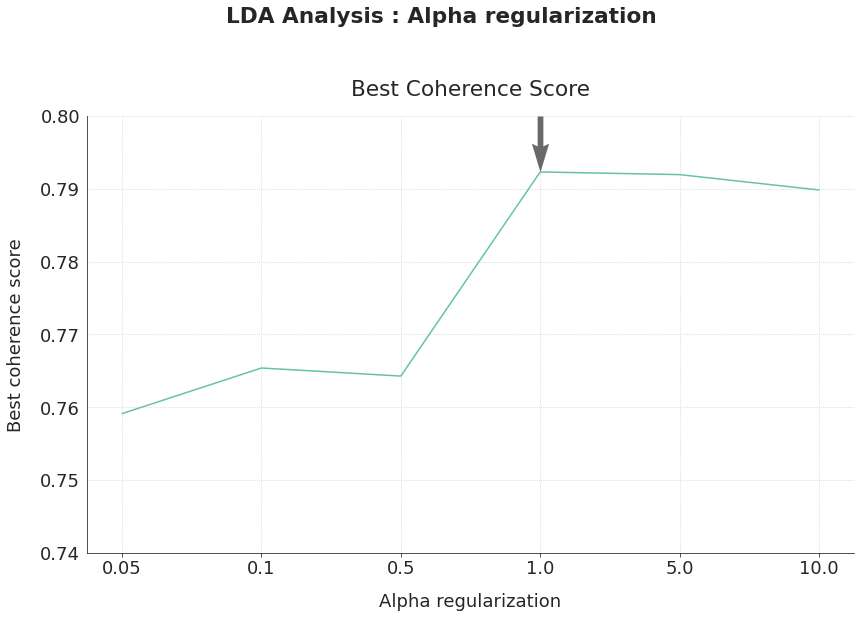

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="lda_alpha", column_name="Alpha regularization",
                         algo_name="LDA Analysis", ymax=0.80, ymin=0.74, show_time=False)
plt.show()

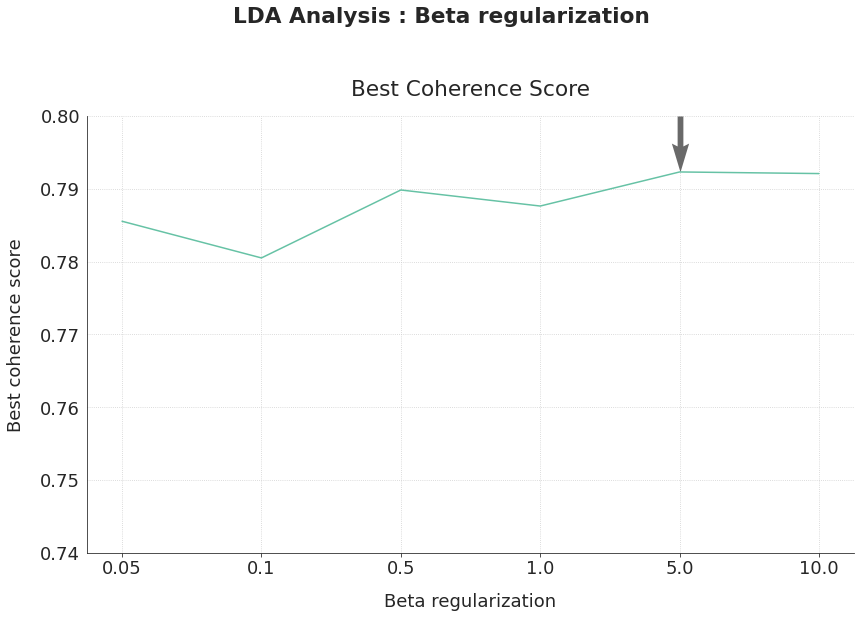

In [ ]:
fig, ax = graph_analysis_coherence(lda_results, column_analysis="lda_beta", column_name="Beta regularization",
                         algo_name="LDA Analysis", ymax=0.80, ymin=0.74, show_time=False)
plt.show()

I opt for a BOW on the body of the questions, keeping all types of words, adding bigrams and trigrams to the monograms.  
I opt for a min_df of 1.5% and a max_df of 98% for the vectorizer (in the middle of optimal ranges), and 35 topics (I can test 55 topics if necessary), an alpha of 5.0 and a beta of 10.0 for the LDA model.

<a id="2_4"></a>

### 2.4. Optimal LDA model analysis based on BOW

My analysis leads me to choose the following settings:
- vectorizer = BOW
- limit to nouns = False
- min_df = 0.015
- max_df = 0.98
- ngram range = (1, 3)
- n_components = 35
- doc_topic_prior = 5.0
- topic_word_prior = 10.0

I check that I get similar coherence scores on the sub-part of train data (X_mini) and all train data (X_train).

In [ ]:
nb_topics = 35
lda = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=5.0, topic_word_prior=10.0,
                                n_jobs=-1, random_state=42)
fact = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.015, max_df=0.98, ngram_range=(1, 3), model=lda,
                         limit_to_nouns=False)
fact.fit(X_train.body, X_mini.body)
cv_score = fact.coherence_score()
print("Coherence score for {} topics based on partial training data = {:.2%}".format(nb_topics, cv_score))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Coherence score for 35 topics based on partial training data = 79.13%


In [ ]:
nb_topics = 35
lda = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=5.0, topic_word_prior=10.0,
                                n_jobs=-1, random_state=42)
fact = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.015, max_df=0.98, ngram_range=(1, 3), model=lda,
                         limit_to_nouns=False)
fact.fit(X_train.body, X_train.body)
cv_score = fact.coherence_score()
print("Coherence score for {} topics based on all training data = {:.2%}".format(nb_topics, cv_score))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Coherence score for 35 topics based on all training data = 80.10%


In [ ]:
nb_words = 10
print("{} topics found via LDA - Coherence score = {}".format(nb_topics, cv_score))
fact.print_topics(n_top_words=nb_words)

35 topics found via LDA - Coherence score = 0.8010360097046743

Topic 0:
like code use using example way want file error function

Topic 1:
using like code way want use work file problem know

Topic 2:
using like code file want use work way app need

Topic 3:
code using like use want file way function error following

Topic 4:
want code using like use work file error problem need

Topic 5:
using like code file way want wa example error use

Topic 6:
code like file using use way work need question error

Topic 7:
like code file use error want work way using app

Topic 8:
using file code work use way want like doe error

Topic 9:
code using use like want way file work error question

Topic 10:
use error c code using like want file way work

Topic 11:
like code file use using work want way doe need

Topic 12:
code like using file use want work know way following

Topic 13:
using code like use want file way error time problem

Topic 14:
using code like work use file way want error problem


In [ ]:
pyLDAvis.sklearn.prepare(fact.model, fact.matrix_docwords, fact.vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
10     0.011302 -0.001200       1        1  2.878751
27    -0.002182 -0.005914       2        1  2.866130
7     -0.001456 -0.000672       3        1  2.863373
33     0.000113 -0.000269       4        1  2.859947
31    -0.000858 -0.000686       5        1  2.858972
22    -0.000529  0.000426       6        1  2.858892
2     -0.001036  0.000244       7        1  2.857797
26    -0.000667  0.000411       8        1  2.857663
6     -0.000798  0.000967       9        1  2.857202
32     0.000062  0.000328      10        1  2.857137
5     -0.001425 -0.000045      11        1  2.857096
1      0.000414 -0.000218      12        1  2.856628
24    -0.000355  0.001609      13        1  2.856601
30    -0.001139 -0.001895      14        1  2.856471
11    -0.000277  0.001052      15        1  2.856202
16    -0.001375 -0.001317      16        1  2.856137
13    -0.000460  0.000271      17        1  2.856117
34    -0.000678  0.002078      18        1  2.856097
3      0.001010  0.000042      19        1  2.856043
28     0.000856  0.000207      20        1  2.855782
9     -0.000189 -0.000150      21        1  2.855760
25    -0.000778  0.000205      22        1  2.855732
17     0.000608 -0.000337      23        1  2.855498
18     0.000587 -0.000681      24        1  2.855429
14     0.000160 -0.000961      25        1  2.855412
12    -0.000648  0.000297      26        1  2.855337
8      0.000637 -0.001029      27        1  2.855247
20    -0.000700 -0.000018      28        1  2.855221
23    -0.001138  0.001137      29        1  2.855135
29    -0.000435 -0.001014      30        1  2.854326
15     0.000166 -0.001469      31        1  2.853919
4      0.000703  0.001274      32        1  2.853843
21    -0.000763  0.003299      33        1  2.853659
0      0.001396  0.002506      34        1  2.853383
19    -0.000128  0.001522      35        1  2.853063, topic_info=        Term           Freq          Total Category  logprob  loglift
46         c   18957.000000   18957.000000  Default  30.0000  30.0000
208     like  118065.000000  118065.000000  Default  29.0000  29.0000
393    using  113474.000000  113474.000000  Default  28.0000  28.0000
390      use   90229.000000   90229.000000  Default  27.0000  27.0000
63      code  109145.000000  109145.000000  Default  26.0000  26.0000
..       ...            ...            ...      ...      ...      ...
129  example    1199.600827   50864.598101  Topic35  -5.0232  -0.1904
309      run    1029.822321   36678.932799  Topic35  -5.1758  -0.0160
250   object    1091.740225   42046.873986  Topic35  -5.1175  -0.0942
59     class    1130.829362   52171.485099  Topic35  -5.0823  -0.2748
377     time    1033.540953   43452.298438  Topic35  -5.1722  -0.1819

[2100 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         1  0.034275  able
0         2  0.028417  able
0         3  0.023988  able
0         4  0.029524  able
0         5  0.033445  able
...     ...       ...   ...
421      31  0.023515   xml
421      32  0.028080   xml
421      33  0.021965   xml
421      34  0.026875   xml
421      35  0.027908   xml

[12845 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[11, 28, 8, 34, 32, 23, 3, 27, 7, 33, 6, 2, 25, 31, 12, 17, 14, 35, 4, 29, 10, 26, 18, 19, 15, 13, 9, 21, 24, 30, 16, 5, 22, 1, 20])

Results of the LDA were better with the first set of hyperparameters, when the topics were more different and interpretable.

In [ ]:
for idx_topic in range(nb_topics):
    docmax = np.argmax(fact.matrix_doctopics[:, idx_topic])
    print("Topic {} : {}".format(idx_topic, X_train.iloc[docmax].body))

Topic 0 : I have a datatable with a button in each row:  In the backing bean there's this method:  Everything works fine (when clicked the method is executed), but Eclipse validation fails with this strange message:  Method must have signature "String method(), String method(), String   method(String), String method(String, String), String method(String,   String, String), String method(String, String, String, String), String   method(String, String, String, String, String), String method(String,   String, String, String, String, String), String method(String, String,   String, String, String, String, String), String method(String, String,   String, String, String, String, String, String), String method(String,   String, String, String, String, String, String, String, String),   String method(String, String, String, String, String, String, String,   String, String, String), String method(String, String, String, String,   String, String, String, String, String, String, String), String  

We can see that the topic modelisation doesn't get good results. It is difficult to define a precise subject for each topic.

---
<a id='3_0'></a>

## <font color=blue>3. Topic modeling with Non-negative Matrix Factorization (NMF)</font>

In [ ]:
ITERATION = 0
OUT_FILE = ""

In [ ]:
nmf = NMF(random_state=42)
fact = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.05, max_df=0.95, ngram_range=(1, 1), model=nmf,
                         limit_to_nouns=True)
fact.get_params().keys()

dict_keys(['limit_to_nouns', 'max_df', 'min_df', 'model__alpha', 'model__beta_loss', 'model__init', 'model__l1_ratio', 'model__max_iter', 'model__n_components', 'model__random_state', 'model__shuffle', 'model__solver', 'model__tol', 'model__verbose', 'model', 'ngram_range', 'stop_words', 'vectorizer_type'])

In [ ]:
space_fact = {
    "data": hp.choice("data", ["body", "title", "both"]),
    "vectorizer_type": hp.choice("vectorizer_type", ["BOW", "TFIDF"]),
    "min_df": hp.uniform("min_df", 0.01, 0.05),
    "max_df": hp.uniform("max_df", 0.95, 0.99),
    "ngram_range": hp.choice("ngram_range", [(1, 1), (1, 2), (1, 3)]),
    "limit_to_nouns": hp.choice("limit_to_nouns", [True, False]),
    "model__n_components" : hp.choice("n_components",
                                      np.arange(10, 100, 5, dtype=int)),
    "model__alpha": hp.uniform("alpha", 0.0, 1.0),
    "model__l1_ratio": hp.uniform("l1_ratio", 0.0, 1.0)}

In [ ]:
def objective_fact(params):
    global ITERATION, OUT_FILE
    ITERATION += 1

    input_data = params["data"]
    params_fact = {k:v for (k,v) in params.items() if k.startswith("data")==False}
    fact.set_params(**params_fact)

    start_time = timer()
    fact.fit(X_train[input_data], X_mini[input_data])
    fact_time = timer() - start_time
    
    score = fact.coherence_score()
    loss = -score

    of_connection = open(OUT_FILE, 'a')
    writer = csv.writer(of_connection)
    writer.writerow([score, fact_time, input_data, params_fact, ITERATION])
    of_connection.close()
    
    return {"loss": loss, "fact_time": fact_time, "params": params,
            "iteration": ITERATION, "status": STATUS_OK}

In [ ]:
def run_fact_optimization(fact_file, max_evals=200):
    global OUT_FILE
    OUT_FILE = fact_file
    of_connection = open(OUT_FILE, "w")  # Write the headers to the file
    writer = csv.writer(of_connection)
    writer.writerow(["coherence_score", "factorization_time", "data", "params", "iteration"])
    of_connection.close()
    
    global ITERATION
    ITERATION = 0

    trials = Trials()
    
    best_param = fmin(objective_fact, space_fact,
                      algo=tpe.suggest, trials=trials,
                      max_evals=max_evals, rstate=np.random.RandomState(42))
    
    list_losses = [t["result"]["loss"] for t in trials.trials]
    idx_min = np.argmin(list_losses)

    print("Hyperparameters optimization done")
    print("Best coherence score = {}"\
          .format(-trials.trials[idx_min]["result"]["loss"]))
    print("Calculation time = {}"\
          .format(trials.trials[idx_min]["result"]["fact_time"]))
    print("Best coherence score obtained after {} iterations"\
          .format(trials.trials[idx_min]["result"]["iteration"]))
    print("")

In [ ]:
fact_file = "hyperopt_nouns_nmf_first.csv"
run_fact_optimization(fact_file, max_evals=100)

  0%|          | 0/100 [00:00<?, ?it/s, best loss: ?]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))

/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()



  1%|          | 1/100 [23:42<39:07:37, 1422.80s/it, best loss: -0.30096464267486084]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  2%|▏         | 2/100 [45:48<37:56:27, 1393.75s/it, best loss: -0.30096464267486084]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  3%|▎         | 3/100 [1:09:15<37:39:41, 1397.75s/it, best loss: -0.7043399181274226]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  4%|▍         | 4/100 [1:12:41<27:44:20, 1040.21s/it, best loss: -0.7043399181274226]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  5%|▌         | 5/100 [1:17:24<21:27:01, 812.86s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  6%|▌         | 6/100 [1:17:50<15:03:37, 576.78s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  7%|▋         | 7/100 [1:18:02<10:31:47, 407.61s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  8%|▊         | 8/100 [1:43:27<18:58:59, 742.82s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



  9%|▉         | 9/100 [2:07:36<24:07:50, 954.62s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 10%|█         | 10/100 [2:32:11<27:45:51, 1110.58s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 11%|█         | 11/100 [2:54:59<29:22:10, 1187.98s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 12%|█▏        | 12/100 [2:57:11<21:17:26, 870.99s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 13%|█▎        | 13/100 [3:21:01<25:06:22, 1038.87s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 14%|█▍        | 14/100 [3:21:19<17:29:57, 732.53s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 15%|█▌        | 15/100 [3:24:30<13:27:30, 570.01s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 16%|█▌        | 16/100 [3:27:18<10:29:08, 449.39s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 17%|█▋        | 17/100 [3:27:42<7:25:02, 321.72s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 18%|█▊        | 18/100 [3:51:12<14:45:55, 648.23s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 19%|█▉        | 19/100 [3:53:08<10:59:41, 488.66s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 20%|██        | 20/100 [3:56:28<8:55:53, 401.92s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 21%|██        | 21/100 [4:00:41<7:50:41, 357.49s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 22%|██▏       | 22/100 [4:23:51<14:27:07, 667.02s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 23%|██▎       | 23/100 [4:47:22<19:02:30, 890.27s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 24%|██▍       | 24/100 [4:51:53<14:52:26, 704.56s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 25%|██▌       | 25/100 [4:56:24<11:58:04, 574.46s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 26%|██▌       | 26/100 [5:22:10<17:48:01, 865.97s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 27%|██▋       | 27/100 [5:45:50<20:55:39, 1032.04s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 28%|██▊       | 28/100 [5:50:56<16:17:02, 814.20s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 29%|██▉       | 29/100 [6:14:02<19:26:34, 985.83s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 30%|███       | 30/100 [6:19:01<15:09:44, 779.77s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 31%|███       | 31/100 [6:42:01<18:23:51, 959.88s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 32%|███▏      | 32/100 [7:08:01<21:31:52, 1139.89s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 33%|███▎      | 33/100 [7:08:28<15:00:11, 806.14s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 34%|███▍      | 34/100 [7:13:42<12:04:15, 658.42s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 35%|███▌      | 35/100 [7:39:24<16:40:28, 923.51s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 36%|███▌      | 36/100 [7:39:49<11:37:29, 653.90s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 37%|███▋      | 37/100 [8:04:13<15:41:47, 896.94s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 38%|███▊      | 38/100 [8:07:17<11:45:58, 683.21s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 39%|███▉      | 39/100 [8:32:45<15:52:17, 936.68s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 40%|████      | 40/100 [8:35:29<11:44:43, 704.73s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 41%|████      | 41/100 [8:38:28<8:57:48, 546.92s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 42%|████▏     | 42/100 [9:03:37<13:27:55, 835.78s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 43%|████▎     | 43/100 [9:09:39<10:58:41, 693.36s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 44%|████▍     | 44/100 [9:12:35<8:22:17, 538.16s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 45%|████▌     | 45/100 [9:14:48<6:22:08, 416.88s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 46%|████▌     | 46/100 [9:39:57<11:09:50, 744.26s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 47%|████▋     | 47/100 [9:42:45<8:24:57, 571.65s/it, best loss: -0.7112755236994431] 

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 48%|████▊     | 48/100 [9:45:31<6:29:43, 449.68s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 49%|████▉     | 49/100 [9:50:53<5:49:54, 411.65s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 50%|█████     | 50/100 [10:14:26<9:53:10, 711.81s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 51%|█████     | 51/100 [10:17:36<7:33:27, 555.26s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 52%|█████▏    | 52/100 [10:19:34<5:39:28, 424.34s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 53%|█████▎    | 53/100 [10:22:25<4:32:40, 348.09s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 54%|█████▍    | 54/100 [10:27:15<4:13:33, 330.73s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 55%|█████▌    | 55/100 [10:50:29<8:07:20, 649.79s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 56%|█████▌    | 56/100 [10:53:38<6:15:09, 511.59s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 57%|█████▋    | 57/100 [11:15:47<9:02:20, 756.76s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 58%|█████▊    | 58/100 [11:16:12<6:16:00, 537.15s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 59%|█████▉    | 59/100 [11:41:36<9:29:18, 833.12s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



 60%|██████    | 60/100 [11:46:01<7:21:49, 662.75s/it, best loss: -0.7112755236994431]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))



In [ ]:
nmf_results = get_nmf_results("hyperopt_nouns_nmf_first.csv")
nmf_results.sort_values(by="coherence_score", ascending=False).head(10)

,coherence_score,factorization_time,data,iteration,vectorizer,mindf,maxdf,ngram_range,nouns_only,nmf_ntopics,nmf_alpha,nmf_l1_ratio
4,0.711276,268.652671,both,5,TFIDF,0.029,0.989,"(1, 3)",False,40,0.490,0.523
2,0.704340,1404.290445,body,3,BOW,0.036,0.974,"(1, 3)",True,10,0.345,0.864
29,0.703854,283.827988,both,30,BOW,0.028,0.964,"(1, 3)",False,40,0.004,0.917
20,0.686649,246.914409,body,21,TFIDF,0.032,0.989,"(1, 3)",False,10,0.773,0.808
26,0.686446,1416.257428,body,27,BOW,0.035,0.983,"(1, 3)",True,25,0.529,0.032
21,0.684951,1386.454357,body,22,TFIDF,0.032,0.987,"(1, 3)",True,10,0.090,0.113
58,0.684009,1519.285323,both,59,BOW,0.026,0.953,"(1, 3)",True,10,0.937,0.846
38,0.680512,1525.038711,both,39,TFIDF,0.037,0.990,"(1, 3)",True,10,0.247,0.996
48,0.680132,303.114055,both,49,TFIDF,0.020,0.970,"(1, 3)",False,70,0.054,0.341
28,0.676090,1383.533850,body,29,TFIDF,0.039,0.985,"(1, 3)",True,10,0.204,0.580


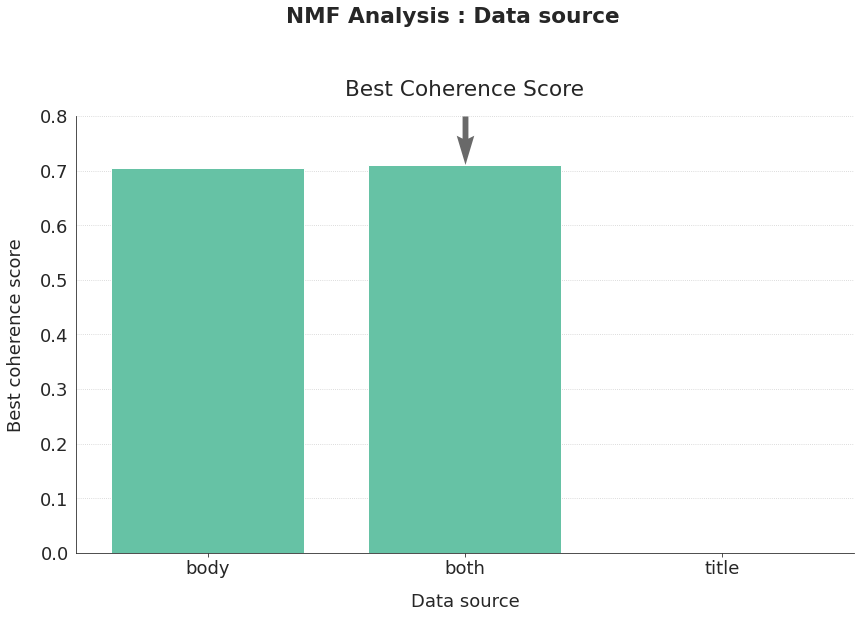

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="data", column_name="Data source",
                                   algo_name="NMF Analysis", ymax=0.80, isbar=True, show_time=False)
plt.show()

The zero coherence score for title as a data source comes from the fact that I force a vocabulary larger than 3 times the number of topics to get a valid coherence score. The model doesn't result in a large enough vocabulary set to get a valid score when I use only the titles as input.

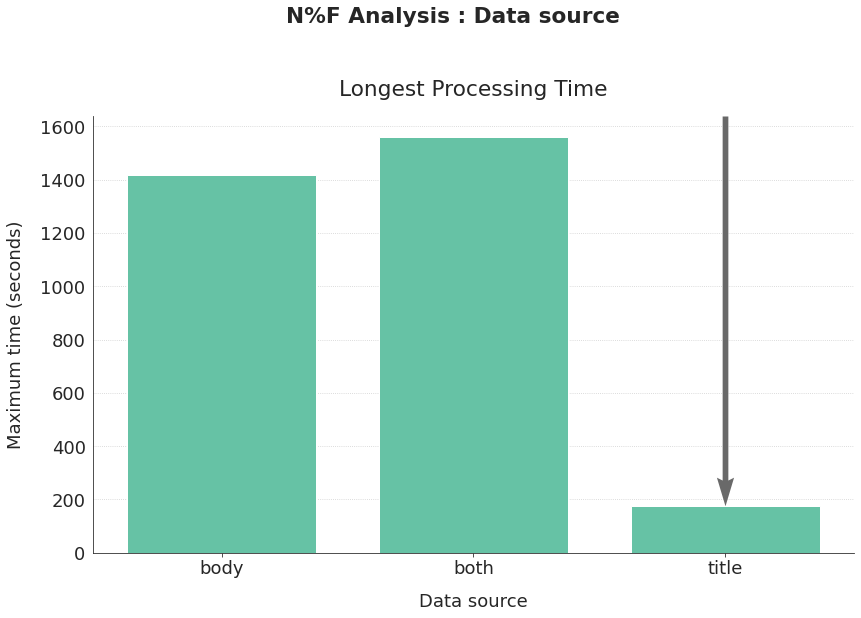

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="data", column_name="Data source",
                         algo_name="N%F Analysis", isbar=True, show_time=True)
plt.show()

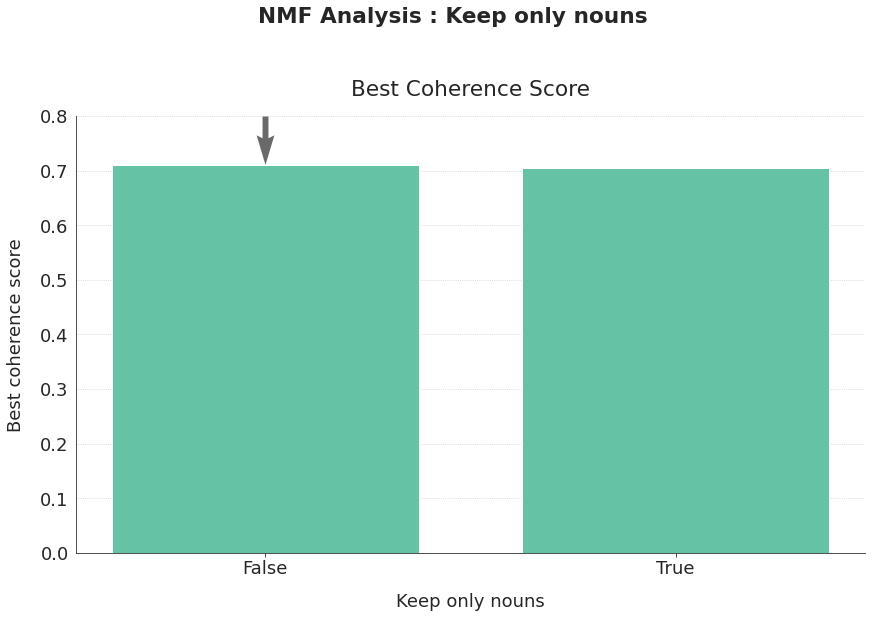

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="nouns_only", column_name="Keep only nouns",
                                   algo_name="NMF Analysis", ymax=0.80, isbar=True, show_time=False)
plt.show()

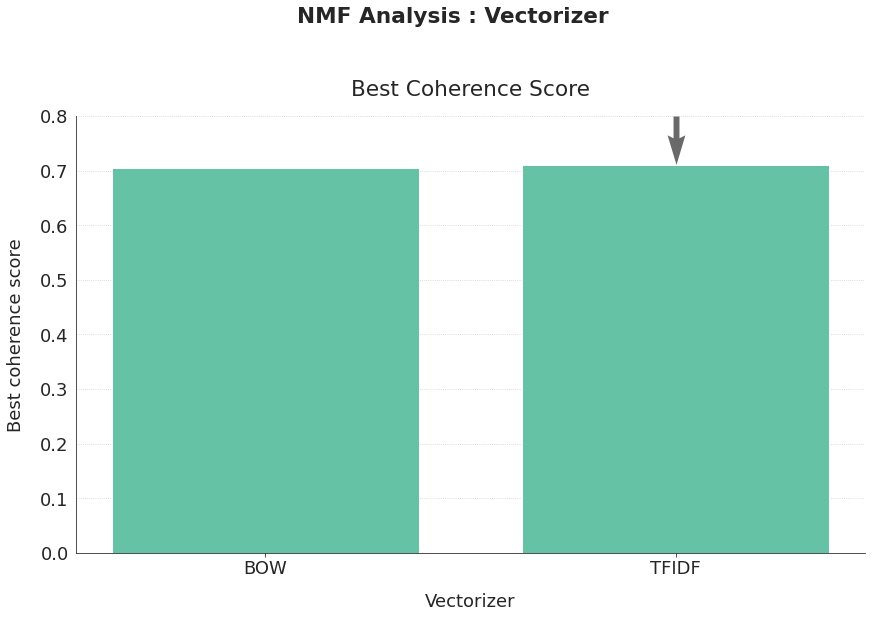

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="vectorizer", column_name="Vectorizer",
                         algo_name="NMF Analysis", ymax=0.80, isbar=True, show_time=False)
plt.show()

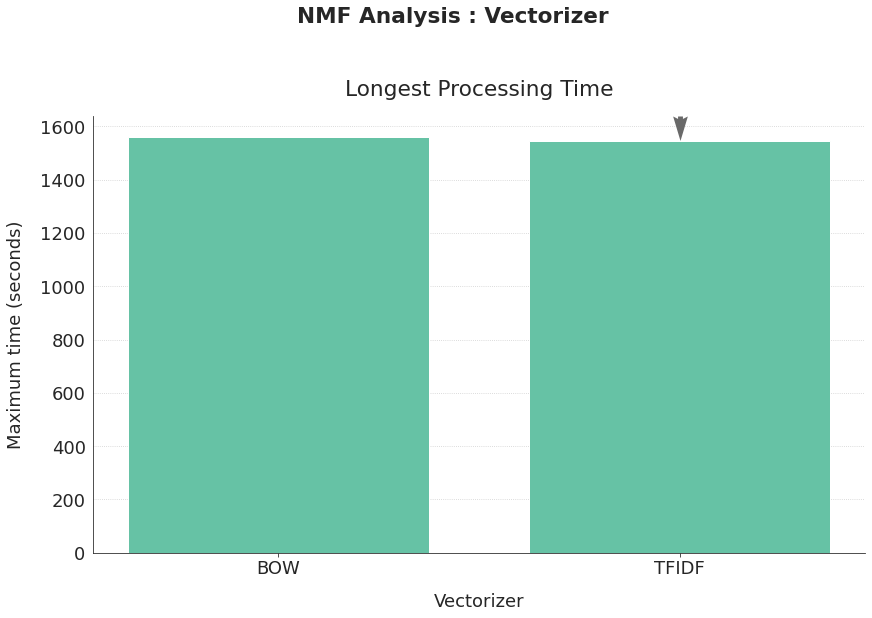

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="vectorizer", column_name="Vectorizer",
                         algo_name="NMF Analysis", isbar=True, show_time=True)
plt.show()

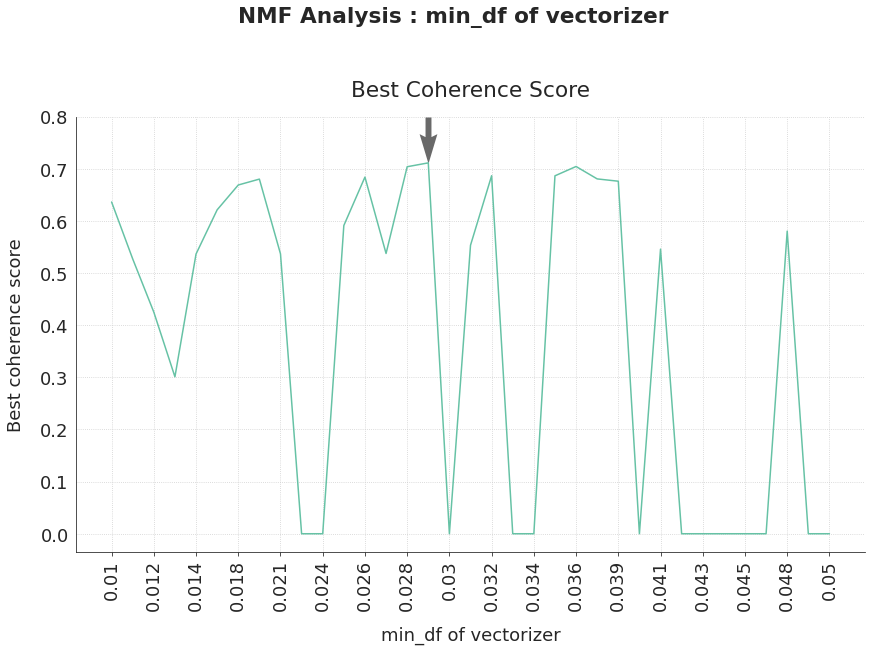

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="mindf", column_name="min_df of vectorizer",
                         algo_name="NMF Analysis", ymax=0.80, tick_step=2, rotation=90, show_time=False)
plt.show()

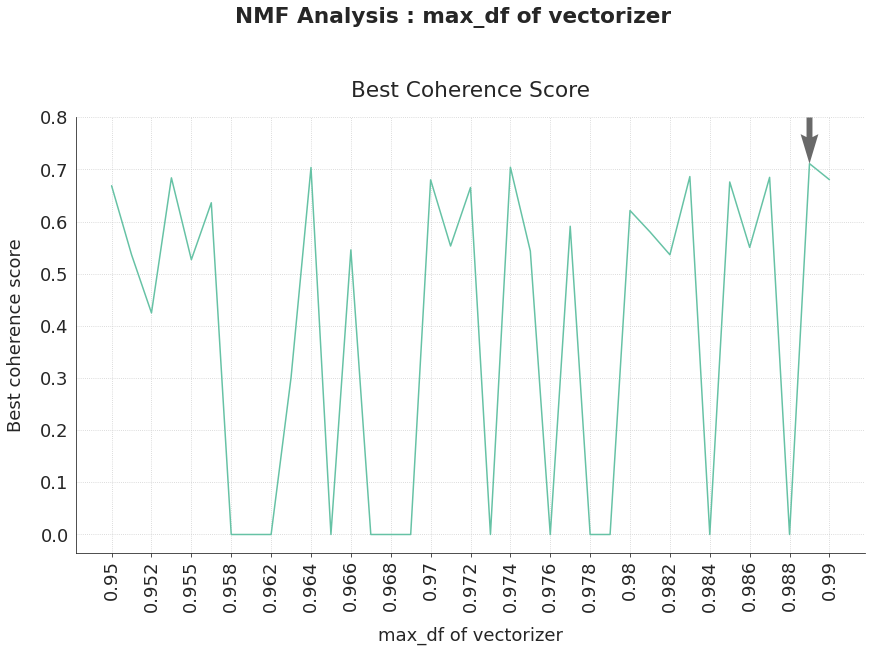

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="maxdf", column_name="max_df of vectorizer",
                         algo_name="NMF Analysis", ymax=0.80, tick_step=2, rotation=90, show_time=False)
plt.show()

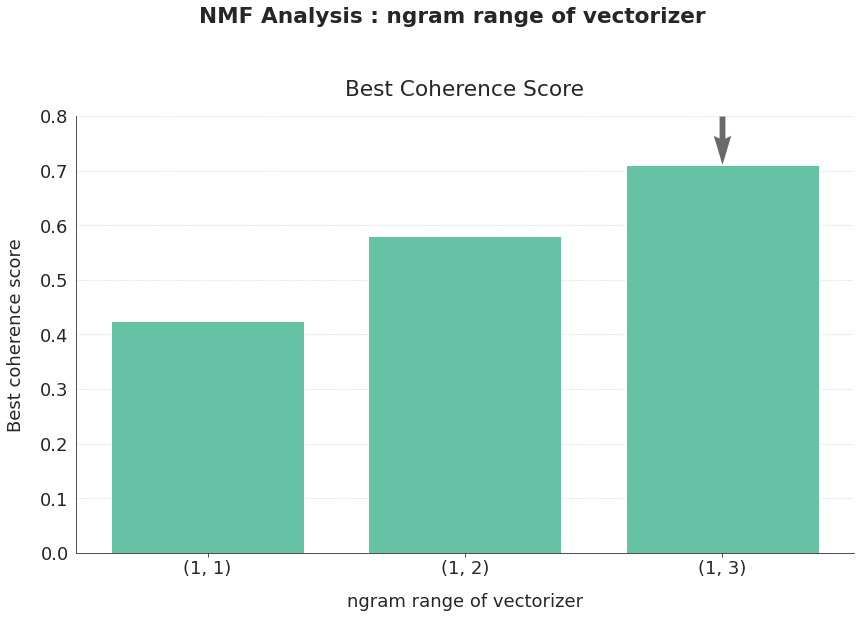

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="ngram_range", column_name="ngram range of vectorizer",
                         algo_name="NMF Analysis", ymax=0.80, isbar=True, show_time=False)
plt.show()

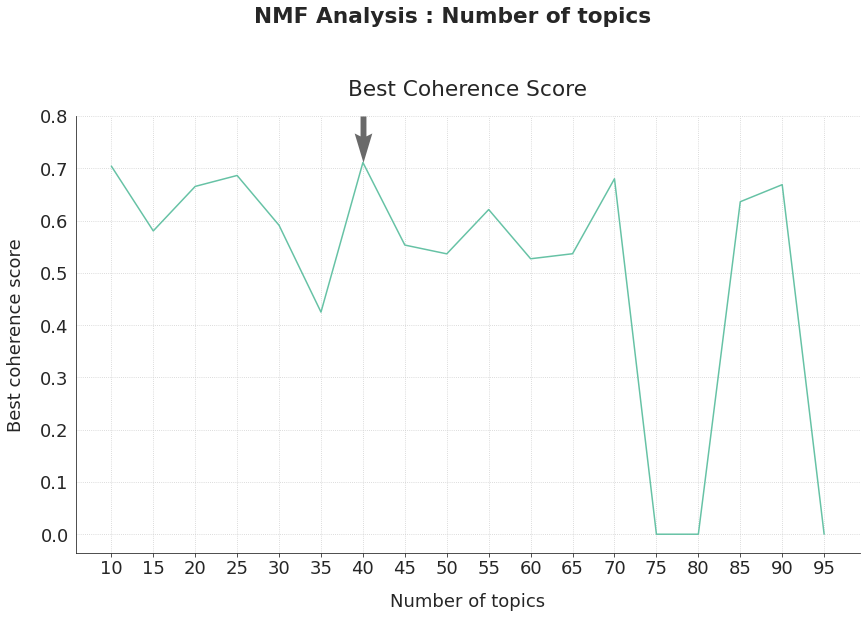

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="nmf_ntopics", column_name="Number of topics",
                         algo_name="NMF Analysis", ymax=0.80, show_time=False)
plt.show()

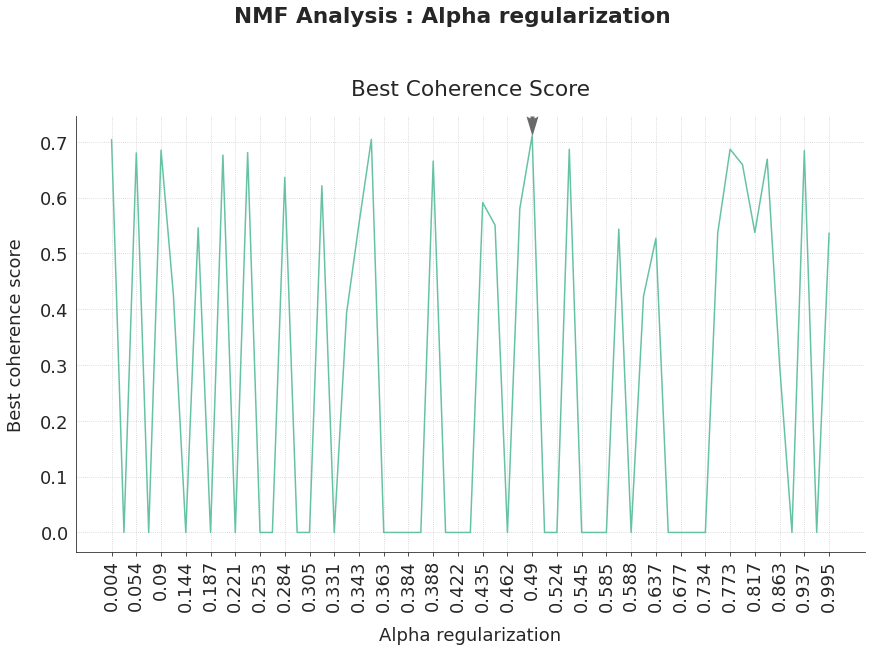

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="nmf_alpha", column_name="Alpha regularization",
                         algo_name="NMF Analysis", tick_step=2, rotation=90, show_time=False)
plt.show()

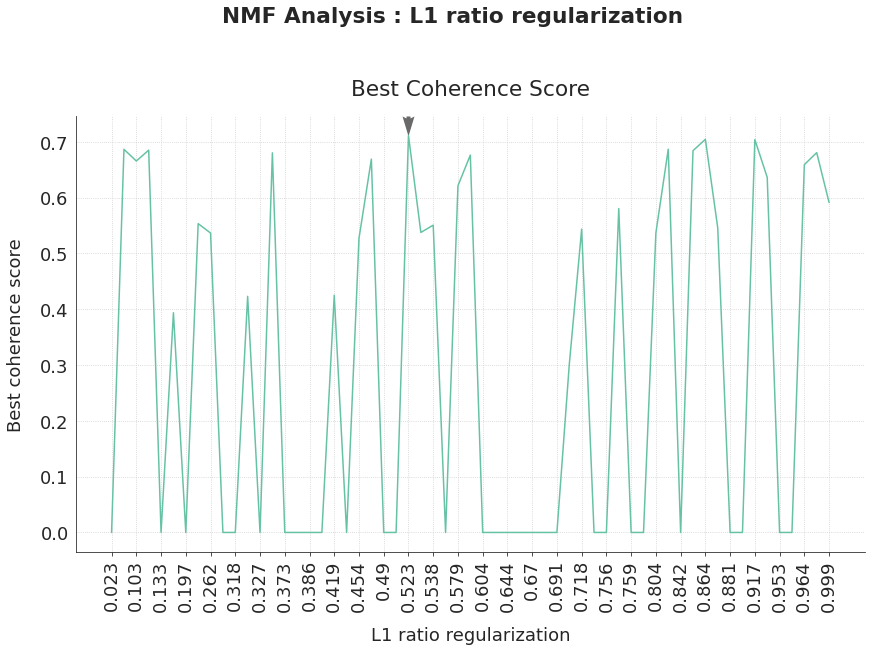

In [ ]:
fig, ax = graph_analysis_coherence(nmf_results, column_analysis="nmf_l1_ratio", column_name="L1 ratio regularization",
                         algo_name="NMF Analysis", tick_step=2, rotation=90, show_time=False)
plt.show()

The best option is to use a TF-IDF on both the body and the title of the questions, keeping all types of words, adding bigrams and trigrams to the monograms.  
I pick other parameters close to optimal results (round values within the range of optimal values) : min_df of 3% and max_df of 99% for the vectorizer, and a number of 40 topics, an alpha of 0.5 and a l1_ratio of 0.5 for the NMF model.

I check that I get similar coherence scores on the sub-part of train data (X_mini) and all train data (X_train).

In [ ]:
nb_topics = 40
nmf = NMF(n_components=nb_topics, alpha=0.50, l1_ratio=0.50, random_state=42)
fact = TextFactorization(vectorizer_type="TFIDF", stop_words=full_stop_words,
                         min_df=0.03, max_df=0.99, ngram_range=(1, 3), model=nmf,
                         limit_to_nouns=False)
fact.fit(X_train.both, X_mini.both)
cv_score = fact.coherence_score()
print("Coherence score for {} topics based on partial training data = {:.2%}".format(nb_topics, cv_score))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


Coherence score for 40 topics based on partial training data = 71.66%


In [ ]:
fact.fit(X_train.both, X_train.both)
cv_score = fact.coherence_score()
print("Coherence score for {} topics based on all training data = {:.2%}".format(nb_topics, cv_score))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Coherence score for 40 topics based on all training data = 73.58%


In [ ]:
nb_words = 10
print("{} topics found via LDA - Coherence score = {}".format(nb_topics, cv_score))
fact.print_topics(n_top_words=nb_words)

40 topics found via LDA - Coherence score = 0.7358336890114199

Topic 0:
code following source exception working problem wrong c# trying output

Topic 1:
file read open script content write j load source create

Topic 2:
way want number set know need example best make possible

Topic 3:
class instance property implement create field access custom add c#

Topic 4:
error getting following message trying try tried fix run problem

Topic 5:
string remove return contains number c# need example output want

Topic 6:
table column query sql database key field result create want

Topic 7:
array size javascript number result key output create given return

Topic 8:
function return parameter called javascript example inside write used result

Topic 9:
python script library run version x running program output process

Topic 10:
android google com api application support button build library http

Topic 11:
value key return set default field property column input result

Topic 12:
image size displ

I have some interesting words in the 5 top-words of a lot of topics. However, those top words seem to me less interesting than those we got with the LDA model based on BOW.

Visualization of documents by topics with TSNE

In [ ]:
fact.fit(X_train.both, X_mini.both)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


TextFactorization(limit_to_nouns=False, max_df=0.99, min_df=0.03,
                  model=NMF(alpha=0.5, beta_loss='frobenius', init=None,
                            l1_ratio=0.5, max_iter=200, n_components=40,
                            random_state=42, shuffle=False, solver='cd',
                            tol=0.0001, verbose=0),
                  ngram_range=(1, 3),
                  stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'ours',
                              'ourselves', 'you', "you're", "you've", "you'll",
                              "you'd", 'your', 'yours', 'yourself',
                              'yourselves', 'he', 'him', 'his', 'himself',
                              'she', "she's", 'her', 'hers', 'herself', 'it',
                              "it's", 'its', 'itself', ...],
                  vectorizer_type='TFIDF')

In [ ]:
X_reduc = []
list_perplexity = [10, 30, 50, 100, 250, 500]
for perplexity in list_perplexity:
    reduc = TSNE(perplexity=perplexity, n_jobs=-1, random_state=42)
    X_reduc.append(pd.DataFrame(reduc.fit_transform(fact.matrix_docwords),
                                index=X_mini.index,
                                columns=["Axe 1", "Axe 2"]))

In [ ]:
X_main_topic = np.argmax(fact.matrix_doctopics, axis=1)

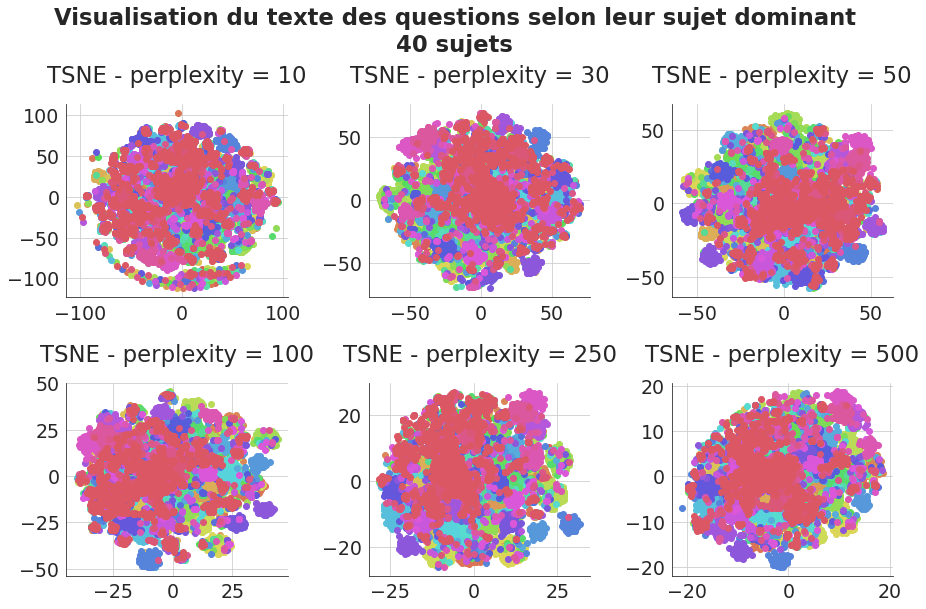

In [ ]:
graph_title = "Visualisation du texte des questions selon leur sujet dominant\n{} sujets".format(nb_topics)
graph = sfg.MyGraph(graph_title, y_title=0.95, nblin=2, nbcol=3,
                    color_palette="hls", ncolors=40, figsize=(13,9))
for i in range(len(list_perplexity)):
    xreduc = X_reduc[i]
    for t in range(nb_topics):
        graph.add_scatter(xreduc[X_main_topic==t].iloc[:, 0], xreduc[X_main_topic==t].iloc[:, 1],
                          uniquecolor=graph.liste_couleurs[t],
                          subtitle="TSNE - perplexity = {}".format(list_perplexity[i]),
                          multi_index=i+1)
fig, ax = graph.fig, graph.ax
plt.show()

We still have some overlapping between some topics.

---
<a id='4_0'></a>

## <font color=blue>4. Final unsupervised model selected</font>

### 4.1. Unsupervised suggestion of tags

I choose the LDA model with BOW, with the parameters we first determined to be optimal for the TF-IDF and 65 topics.  
Its coherence score is about 75%. The 5 top-words of each topic seem to me to make globally more sense than those of the NMF.  
The most probable topic will be determined when an user enters a new question. The 5-top words of this topic will be the suggestions of tags.

In [ ]:
nb_topics = 65
lda2 = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=0.5, topic_word_prior=5.0,
                                n_jobs=-1, random_state=42)
fact2 = TextFactorization(vectorizer_type="BOW", stop_words=full_stop_words,
                         min_df=0.011, max_df=0.98, ngram_range=(1, 3), model=lda2,
                         limit_to_nouns=False)
fact2.fit(X_train.body, X_train.body)
cv_score2 = fact2.coherence_score()
print("Coherence score for {} topics and a BOW vectorization based on all training data = {:.2%}"\
      .format(nb_topics, cv_score2))

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


Coherence score for 65 topics and a BOW vectorization based on all training data = 74.78%


In [ ]:
nb_words = 5
print("{} topics found via LDA - Coherence score = {}".format(nb_topics, cv_score2))
fact2.print_topics(n_top_words=nb_words)

65 topics found via LDA - Coherence score = 0.747841709252355

Topic 0:
thread task main block operation

Topic 1:
library support developer native use

Topic 2:
list json like using want

Topic 3:
file directory read output write

Topic 4:
net web c# asp asp net

Topic 5:
class instance method static member

Topic 6:
table row id delete want

Topic 7:
request api header content send

Topic 8:
query column event loop connection

Topic 9:
index width want bug fixed

Topic 10:
wa custom wondering statement using

Topic 11:
update process store database structure

Topic 12:
field model django create like

Topic 13:
android folder core tried using

Topic 14:
following parameter log warning following code

Topic 15:
java eclipse resource org source

Topic 16:
default difference use mysql using

Topic 17:
know want state option example

Topic 18:
http com google doc github

Topic 19:
element map available space way

Topic 20:
say let device template b

Topic 21:
look exception fine look like

In [ ]:
pyLDAvis.sklearn.prepare(fact2.model, fact2.matrix_docwords, fact2.vectorizer)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
53    -0.038065 -0.004006       1        1  2.401587
41     0.258512  0.068006       2        1  2.050299
17    -0.138361 -0.011064       3        1  2.018484
38     0.250637 -0.026544       4        1  1.990235
21     0.029018 -0.067059       5        1  1.962349
...         ...       ...     ...      ...       ...
24    -0.021197 -0.116113      61        1  1.295749
23    -0.029844 -0.021452      62        1  1.283044
25    -0.096822  0.022873      63        1  1.279624
2     -0.061120 -0.050180      64        1  1.237174
49    -0.021543 -0.054703      65        1  1.212311

[65 rows x 5 columns], topic_info=        Term          Freq         Total Category  logprob  loglift
202     file  77834.000000  77834.000000  Default  30.0000  30.0000
178    error  52141.000000  52141.000000  Default  29.0000  29.0000
134     data  46284.000000  46284.000000  Default  28.0000  28.0000
85     class  46220.000000  46220.000000  Default  27.0000  27.0000
540    value  42886.000000  42886.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
426      run    556.890277  36888.544322  Topic65  -5.0318   0.2194
232       ha    615.270511  49888.270104  Topic65  -4.9321   0.0172
182  example    548.685532  50918.996853  Topic65  -5.0466  -0.1178
534     used    461.683485  27721.895071  Topic65  -5.2193   0.3175
239     help    456.801932  27822.337221  Topic65  -5.2299   0.3033

[3019 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         1  0.023679  able
0         2  0.010669  able
0         3  0.011704  able
0         4  0.004592  able
0         5  0.007293  able
...     ...       ...   ...
572      61  0.010933   yes
572      62  0.025319   yes
572      63  0.016112   yes
572      64  0.004891   yes
572      65  0.024168   yes

[37180 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[54, 42, 18, 39, 22, 45, 12, 51, 4, 1, 37, 64, 6, 57, 30, 19, 55, 43, 11, 59, 23, 15, 62, 35, 47, 53, 27, 21, 41, 32, 56, 48, 5, 8, 20, 28, 9, 46, 33, 7, 52, 60, 17, 58, 36, 2, 31, 63, 34, 61, 40, 13, 16, 44, 49, 29, 65, 10, 14, 38, 25, 24, 26, 3, 50])

<a id="4_2"></a>

### 4.2. Semi-supervised classification of tags

I can use those results to estimate the tags among my list of 50 tags.  
I multiply the matrix documents/topics and the matrix documents/tags to get a matrix that give the probability of each tag for each topic.  
Then I can get the most probable topic for a document, and thus get the top 3 tags of this topic as an estimation of tags.  
With this approach, I will always get tags (3 tags), unlike with the supervised approach which can return no tag if it estimates that no tag is relevant.

<a id="4_3"></a>

### 4.3. Saving the model for production

I define the model that I want to save. I fit it. I test the functions on random questions from validation data. Then I save the model. 

In [ ]:
nb_topics = 65
lda = LatentDirichletAllocation(n_components=nb_topics,
                                doc_topic_prior=0.5, topic_word_prior=5.0,
                                n_jobs=-1, random_state=42)
model = LightTextFactorization(stop_words=full_stop_words,
                               min_df=0.011, max_df=0.98, ngram_range=(1, 3),
                               model=lda)
model.fit(X_train.body, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['doe', 'ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


LightTextFactorization(max_df=0.98, min_df=0.011,
                       model=LatentDirichletAllocation(batch_size=128,
                                                       doc_topic_prior=0.5,
                                                       evaluate_every=-1,
                                                       learning_decay=0.7,
                                                       learning_method='batch',
                                                       learning_offset=10.0,
                                                       max_doc_update_iter=100,
                                                       max_iter=10,
                                                       mean_change_tol=0.001,
                                                       n_components=65,
                                                       n_jobs=-1, perp_tol=0.1,
                                                       random_state=42,
                                               

In [ ]:
# take 10 rows from validation and look at the top topic and top tags
nb_rows = len(X_valid)
for row in np.random.randint(nb_rows, size=10):
    my_X = [X_valid.iloc[row].body]
    print("Row n°{}".format(row))
    print("  Topic : {}".format(model.get_top_topic_index(my_X)))
    print("  Tags suggested : {}".format(model.get_top_topic_words(my_X)))
    tags_infered = model.get_top_topic_tags(my_X)
    print("  Tags infered : {}".format([list_of_labels[i] for i in tags_infered]))
    print("")

Row n°26703
  Topic : 32
  Tags suggested : ['string', 'text', 'character', 'match', 'replace']
  Tags infered : ['java', 'c#', 'python']

Row n°46951
  Topic : 63
  Tags suggested : ['app', 'user', 'apps', 'play', 'id']
  Tags infered : ['android', 'javascript', 'java']

Row n°11539
  Topic : 5
  Tags suggested : ['class', 'instance', 'method', 'static', 'member']
  Tags infered : ['java', 'c#', 'python']

Row n°55210
  Topic : 53
  Tags suggested : ['code', 'make', 'answer', 'link', 'edit']
  Tags infered : ['java', 'c#', 'javascript']

Row n°23872
  Topic : 47
  Tags suggested : ['number', 'form', 'feature', 'algorithm', 'given']
  Tags infered : ['python', 'java', 'javascript']

Row n°40295
  Topic : 41
  Tags suggested : ['project', 'build', 'studio', 'installed', 'visual']
  Tags infered : ['c#', 'android', 'java']

Row n°62817
  Topic : 22
  Tags suggested : ['method', 'property', 'path', 'sort', 'n']
  Tags infered : ['c#', 'java', 'javascript']

Row n°50216
  Topic : 4
  Tags 

The infered tags got with the supervised model seem more accurate. However, tags suggested may be a good addition to the super

I save the model with joblib.

In [41]:
joblib.dump(model, "ml05_unsupervised_tags.joblib")

['ml05_unsupervised_tags.joblib']